In [329]:
tad

[1] "tad185"

## Read  annotation

In [1]:
## Load Library
library("susiF.alpha")
library("plink2R")
library("dplyr")
library("readr")
library("stringr")
library("purrr")
library("tidyr")
library("ggplot2")

Loading required package: Rcpp

Loading required package: RcppEigen


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
options(repr.plot.width =30, repr.plot.height = 20)

In [32]:
Neu_int = read_delim("../added_annotation/Neu_hg38.Int.Nott.tsv")
Oli_int = read_delim("../added_annotation/Oli_hg38.Int.Nott.tsv")

Rows: 93290 Columns: 14
── Column specification ────────────────────────────────────────────────────────
Delimiter: " "
chr  (4): chr1, chr2, ClusterLabel, ClusterType
dbl (10): start1, end1, start2, end2, count, expected, fdr, ClusterSize, Clu...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
New names:
• `` -> `...1`
Rows: 61895 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (4): chr1, chr2, ClusterLabel, ClusterType
dbl (11): ...1, start1, end1, start2, end2, count, expected, fdr, ClusterSiz...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [33]:
rbind(Neu_int%>%mutate(type = "Neu"),Oli_int%>%select(-`...1`)%>%mutate(type = "Oli"))-> annotation

In [34]:
annotation

chr1,start1,end1,chr2,start2,end2,count,expected,fdr,ClusterLabel,ClusterSize,ClusterType,ClusterNegLog10P,ClusterSummit,type
<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
chr1,955000,960000,chr1,965000,970000,45,20.298997,6.811625e-05,chr1_01,1,Singleton,6.171725,1,Neu
chr1,3770000,3775000,chr1,4715000,4720000,15,3.105499,2.449255e-05,chr1_02,1,Singleton,6.688851,1,Neu
chr1,11320000,11325000,chr1,11740000,11745000,15,3.324001,5.219703e-05,chr1_03,1,Singleton,6.308568,1,Neu
chr1,23665000,23670000,chr1,23960000,23965000,15,3.320579,5.175136e-05,chr1_04,1,Singleton,6.314290,1,Neu
chr1,26485000,26490000,chr1,26495000,26500000,64,31.447124,1.423320e-05,chr1_05,1,Singleton,6.954796,1,Neu
chr1,27715000,27720000,chr1,27960000,27965000,19,3.801789,8.928120e-07,chr1_06,1,Singleton,8.341842,1,Neu
chr1,32965000,32970000,chr1,33005000,33010000,47,11.415577,4.696426e-13,chr1_07,1,Singleton,15.177320,1,Neu
chr1,33720000,33725000,chr1,33935000,33940000,28,4.612536,1.291996e-11,chr1_08,1,Singleton,13.619100,1,Neu
chr1,33855000,33860000,chr1,33935000,33940000,26,7.093182,1.669856e-06,chr1_09,1,Singleton,8.019209,1,Neu


## Deciding what table to take

In [4]:
Exc = read_delim("/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/analysis/pseudo_Exc_cs.eqtl","\t")%>%mutate(type = "Exc")

Rows: 238301 Columns: 16
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): variants, ref, alt, cs_order, log10_base_factor, molecular_trait_id
dbl (9): snps_index, chromosome, position, pip, posterior_mean, posterior_sd...
lgl (1): cs_id

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [5]:
cs_snp = c("chr22:36239710_G_A","chr2:112467578_A_G","chr1:161038745_C_G")

In [6]:
Oli = read_delim("/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/analysis/pseudo_Oli_cs.eqtl","\t")%>%mutate(type = "Oli")

Rows: 115411 Columns: 16
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): variants, ref, alt, cs_order, log10_base_factor, molecular_trait_id
dbl (9): snps_index, chromosome, position, pip, posterior_mean, posterior_sd...
lgl (1): cs_id

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [7]:
Inh = read_delim("/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/analysis/pseudo_Inh_cs.eqtl","\t")%>%mutate(type = "Inh")

Rows: 153143 Columns: 16
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): variants, ref, alt, cs_order, log10_base_factor, molecular_trait_id
dbl (9): snps_index, chromosome, position, pip, posterior_mean, posterior_sd...
lgl (1): cs_id

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [8]:
Ast = read_delim("/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/analysis/pseudo_Ast_cs.eqtl","\t")%>%mutate(type = "Ast")

Rows: 117297 Columns: 16
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): variants, ref, alt, cs_order, log10_base_factor, molecular_trait_id
dbl (9): snps_index, chromosome, position, pip, posterior_mean, posterior_sd...
lgl (1): cs_id

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [9]:
End = read_delim("/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/analysis/pseudo_End_cs.eqtl","\t")%>%mutate(type = "End")

Rows: 5113 Columns: 16
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): variants, ref, alt, cs_order, log10_base_factor, molecular_trait_id
dbl (9): snps_index, chromosome, position, pip, posterior_mean, posterior_sd...
lgl (1): cs_id

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [10]:
Mic = read_delim("/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/analysis/pseudo_Mic_cs.eqtl","\t")%>%mutate(type = "Mic")

Rows: 39479 Columns: 16
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): variants, ref, alt, cs_order, log10_base_factor, molecular_trait_id
dbl (9): snps_index, chromosome, position, pip, posterior_mean, posterior_sd...
lgl (1): cs_id

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [11]:
OPC = read_delim("/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/analysis/pseudo_OPC_cs.eqtl","\t")%>%mutate(type = "OPC")

Rows: 47717 Columns: 16
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (6): variants, ref, alt, cs_order, log10_base_factor, molecular_trait_id
dbl (9): snps_index, chromosome, position, pip, posterior_mean, posterior_sd...
lgl (1): cs_id

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [12]:
pseudo = rbind(Oli,OPC,End,Mic, Inh, Exc,Ast)

In [26]:
pseudo%>%write_delim("psuedo_result.tsv")

In [14]:
h16 = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/haQTL_pure_completed_unlimited_16_99pCS.tsv")
m16 = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/mQTL_pure_completed_unlimited_16_99pCS.tsv")

Rows: 21527 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (4): variants, ref, alt, molecular_trait_id
dbl (11): snps_index, chromosome, position, cs_order, pip, finemapped_region...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 53860 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (4): variants, ref, alt, molecular_trait_id
dbl (11): snps_index, chromosome, position, cs_order, pip, finemapped_region...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [13]:
e16 = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/QTL_fine_mapping/output/eqtl.all_variants_99pCS.tsv")

Rows: 322701 Columns: 17
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (6): variants, ref, alt, cs_order, log10_base_factor, molecular_trait_id
dbl (10): snps_index, chromosome, position, pip, posterior_mean, posterior_s...
lgl  (1): cs_id

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [30]:
cs_snp = c("chr15:92734199_C_G","chr15:91104210_T_G")

In [35]:
pseudo%>%filter(variants %in% cs_snp)

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end,type
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
chr15:92734199_C_G,9951,15,92734199,C,G,c(L1 = 2),NA,22.2577248027846;-1.18526711702013;-0.0590513693127248;-0.0645600374652202;-0.0719263408988331;-0.0768977866460814;-0.0778668306520263;-0.0756242845668731;-0.0715082401281957;-0.0664805931297632,0.13985063,0.04265760,0.10726700,0.3976769,ENSG00000185442,91809883,92809883,Oli
chr15:91104210_T_G,4794,15,91104210,T,G,c(L1 = 1),NA,181.042721718838;-0.45950551926344;-0.458450520486518;-0.462785376318315;-0.470122509571045;-0.47742266830558;-0.482341897280174;-0.483840204507965;-0.481967129444469;-0.477317413226754,0.35171743,-0.23915312,0.32559042,-0.7345214,ENSG00000185518,90099949,91099949,Oli
chr15:92734199_C_G,9951,15,92734199,C,G,c(L1 = 1),NA,16.1286858874022;-0.59286328628619;-0.0307070542705055;-0.0318950787284591;-0.0328882702733857;-0.0335322811456937;-0.0337461066767963;-0.0335051504799844;-0.0328254704500055;-0.0317504708568037,0.05387003,0.01465092,0.06269303,0.2336929,ENSG00000185442,91809883,92809883,OPC
chr15:91104210_T_G,4794,15,91104210,T,G,c(L1 = 1),NA,34.6795816508713;-0.330761673710694;-0.327107831586499;-0.325699315549517;-0.326524432723319;-0.328945641334369;-0.332014661942299;-0.334774884400018;-0.336470391769179;-0.336633589360974,0.29877764,-0.11456451,0.17736971,-0.6459080,ENSG00000185518,90099949,91099949,Inh


In [33]:
e16%>%filter(variants %in% cs_snp)

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end,cs_size
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>


In [34]:
m16%>%filter(variants %in% cs_snp)

variants,snps_index,chromosome,position,ref,alt,cs_order,pip,molecular_trait_id,finemapped_region_start,finemapped_region_end,purity,is_dummy,effect_peak_pos,cs_size
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>


In [198]:
pseudo%>%filter(variants == "chr2:86208944_C_A")

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end,type
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>


In [200]:
e16%>%filter(variants == "chr2:86208944_C_A")

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end,cs_size
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>


In [201]:
m16%>%filter(variants == "chr2:86208944_C_A")

variants,snps_index,chromosome,position,ref,alt,cs_order,pip,molecular_trait_id,finemapped_region_start,finemapped_region_end,purity,is_dummy,effect_peak_pos,cs_size
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>


In [202]:
h16%>%filter(variants == "chr2:86208944_C_A")

variants,snps_index,chromosome,position,ref,alt,cs_order,pip,molecular_trait_id,finemapped_region_start,finemapped_region_end,purity,is_dummy,effect_peak_pos,cs_size
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr2:86208944_C_A,2204,2,86208944,C,A,1,0.9997709,tad174,85400000,86880000,1,0,86547402,1


In [343]:
pseudo = rbind(Oli%>%mutate(type = "Oli"), Inh%>%mutate(type = "Inh"), Exc%>%mutate(type = "Exc" ))

In [530]:
Oli%>%filter(variants%in% cs_snp)

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
chr1:161038745_C_G,2427,1,161038745,C,G,c(L1 = 1),NA,21.8197256985428;-0.115424204406433;-0.133604750871743;-0.149445630037721;-0.157817263981044;-0.158437620360651;-0.15333867968199;-0.144892070374201;-0.134973285835872;-0.124817462140826,0.9629271,0.3061938,0.07528644,4.067051,ENSG00000215845,160038976,161038976


In [531]:
Inh%>%filter(variants%in% cs_snp)

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
chr22:36239710_G_A,2350,22,36239710,G,A,c(L1 = 1),NA,88.5988750661239;-0.475270892782289;-0.47306032377462;-0.474228765478559;-0.477803093521635;-0.482146561264164;-0.48572834700579;-0.487577178376057;-0.487354799745991;-0.485197010969909,1.0000000,-0.5453728,0.04040031,-13.499224,ENSG00000128335,35239953,36239953
chr1:161038745_C_G,2427,1,161038745,C,G,c(L2 = 1),NA,-1.12829119196281;29.3759938957558;-0.120924064459178;-0.160280617854078;-0.191627781150578;-0.212171856571444;-0.219982431326153;-0.213441667504562;-0.189203995353296;-0.134566458777287,0.9965324,0.3284056,0.04579640,7.170992,ENSG00000215845,160038976,161038976


In [532]:
Exc%>%filter(variants%in% cs_snp)

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
chr2:112467578_A_G,1386,2,112467578,A,G,c(L1 = 1),NA,64.2834132168243;0.297674974797601;-0.241767550951292;-0.344042377117203;-0.359349409238605;-0.313444425767143;-0.234483426593593;-0.0362462927889626;0;0,0.9999640,-0.4957653,0.04302537,-11.522626,ENSG00000114999,111482155,112482155
chr22:36239710_G_A,2350,22,36239710,G,A,c(L1 = 1),NA,279.653373261968;0.346838933659484;-0.960255480619737;-1.17645978443108;-0.170312112839904;-0.169636005881786;-0.169428338469118;-0.169993116921462;-0.171597662863376;-0.174432444097148,1.0000000,-0.7478257,0.03145154,-23.777075,ENSG00000128335,35239953,36239953
chr2:112467578_A_G,1386,2,112467578,A,G,c(L1 = 1),NA,109.469859542802;0.389723571972572;0.825745434162795;-1.4524139451967;-0.443184974750392;-0.443304755357369;-0.444061152699037;-0.444986162001371;-0.445649508510802;-0.445779652126948,1.0000000,-0.4896280,0.03269666,-14.974865,ENSG00000144152,111138384,112138384
chr2:112467578_A_G,1386,2,112467578,A,G,c(L1 = 1),NA,73.2612256872826;3.31361797232546;-0.324917293749971;-0.326945507552349;-0.354847116279934;-0.388895871557013;-0.410912160833479;-0.414437017815484;-0.401563605610807;-0.376292655268816,1.0000000,-0.4562568,0.03707465,-12.306436,ENSG00000144161,111255135,112255135
chr2:112467578_A_G,1386,2,112467578,A,G,c(L2 = 4),NA,-2.11080158421335;25.147778336249;-2.44987326494248;4.15020628616928;-0.0943213154290197;-0.0945692024744051;-0.0963465125198799;-0.0985520370312347;-0.10005868470975;-0.100125618649358,0.8002511,-0.2036134,0.10639303,-1.913785,ENSG00000153214,111055268,112055268


In [535]:
pseudo%>%filter(variants %in% cs_snp )%>%count(variants,type,molecular_trait_id,cs_order,z)

variants,type,molecular_trait_id,cs_order,z,n
<chr>,<chr>,<chr>,<chr>,<dbl>,<int>
chr1:161038745_C_G,Inh,ENSG00000215845,c(L2 = 1),7.170992,1
chr1:161038745_C_G,Oli,ENSG00000215845,c(L1 = 1),4.067051,1
chr22:36239710_G_A,Exc,ENSG00000128335,c(L1 = 1),-23.777075,1
chr22:36239710_G_A,Inh,ENSG00000128335,c(L1 = 1),-13.499224,1
chr2:112467578_A_G,Exc,ENSG00000114999,c(L1 = 1),-11.522626,1
chr2:112467578_A_G,Exc,ENSG00000144152,c(L1 = 1),-14.974865,1
chr2:112467578_A_G,Exc,ENSG00000144161,c(L1 = 1),-12.306436,1
chr2:112467578_A_G,Exc,ENSG00000153214,c(L2 = 4),-1.913785,1


In [346]:
gene_name%>%filter(gene_id %in% c("ENSG00000114999","ENSG00000215845","ENSG00000128335","ENSG00000144152","ENSG00000144161","ENSG00000153214" ))

#chr,start,end,gene_id,gene_name
<chr>,<dbl>,<dbl>,<chr>,<chr>
chr1,161038976,161038977,ENSG00000215845,TSTD1
chr2,112055268,112055269,ENSG00000153214,TMEM87B
chr2,112138384,112138385,ENSG00000144152,FBLN7
chr2,112255135,112255136,ENSG00000144161,ZC3H8
chr2,112482155,112482156,ENSG00000114999,TTL
chr22,36239953,36239954,ENSG00000128335,APOL2


In [536]:
pseudo%>%filter(molecular_trait_id %in% c("ENSG00000114999","ENSG00000215845","ENSG00000128335","ENSG00000144152","ENSG00000144161","ENSG00000153214" ))%>%count(type, molecular_trait_id,cs_order,z)-> temp2

In [555]:
inner_join(pseudo%>%filter(variants %in% cs_snp )%>%count(variants,type,molecular_trait_id,cs_order,z),gene_name ,by = c("molecular_trait_id"="gene_id") )%>%select(variants,molecular_trait_id,type,gene_name,z)-> teom1

In [556]:
teom1

variants,molecular_trait_id,type,gene_name,z
<chr>,<chr>,<chr>,<chr>,<dbl>
chr1:161038745_C_G,ENSG00000215845,Inh,TSTD1,7.170992
chr1:161038745_C_G,ENSG00000215845,Oli,TSTD1,4.067051
chr22:36239710_G_A,ENSG00000128335,Exc,APOL2,-23.777075
chr22:36239710_G_A,ENSG00000128335,Inh,APOL2,-13.499224
chr2:112467578_A_G,ENSG00000114999,Exc,TTL,-11.522626
chr2:112467578_A_G,ENSG00000144152,Exc,FBLN7,-14.974865
chr2:112467578_A_G,ENSG00000144161,Exc,ZC3H8,-12.306436
chr2:112467578_A_G,ENSG00000153214,Exc,TMEM87B,-1.913785


In [560]:
teom1 = teom1 %>%
    mutate(path = paste0("/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/tsv/demo.",type,".",molecular_trait_id,".unisusie.fit.variant.tsv") )

In [715]:
pseudo%>%filter(variants == "chr2:86208944_C_A")

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end,type
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>


In [558]:
    extract_table = function(variant_df,type){ 
    if("purity" %in% colnames(variant_df) ){
      variant_df$purity[is.na(variant_df$purity)] = 0
      variant_df[abs(variant_df$purity) < 0.5,7] = 0
      }
     variant_df = variant_df%>%mutate(CS = (cs_order%>%as.factor%>%as.numeric-1)%>%as.factor)%>%
          select( y = pip ,snp = variants,pos = position , CS, molecular_trait_id)%>%mutate(molecular_trait_id = paste0(type,"_",molecular_trait_id ) )
    return(variant_df)
    }

## Load and  extract table

In [354]:
extract_table(Oli%>%filter(molecular_trait_id == "ENSG00000215845"),"Oli_eQTL")

y,snp,pos,CS,molecular_trait_id
<dbl>,<chr>,<dbl>,<fct>,<chr>
0.9629271,chr1:161038745_C_G,161038745,0,Oli_eQTL_ENSG00000215845


In [357]:
inner_join(temp,gene_name ,by = c("molecular_trait_id"="gene_id") )%>%
    mutate(path = paste0("/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/tsv/demo.",type,".",molecular_trait_id,".unisusie.fit.variant.tsv") )->tmp

In [569]:
tmp%>%select(-variant_df,-extract_df)

variants,molecular_trait_id,type,gene_name,z,path
<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>
chr1:161038745_C_G,ENSG00000215845,Inh,TSTD1,7.170992,/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/tsv/demo.Inh.ENSG00000215845.unisusie.fit.variant.tsv
chr1:161038745_C_G,ENSG00000215845,Oli,TSTD1,4.067051,/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/tsv/demo.Oli.ENSG00000215845.unisusie.fit.variant.tsv
chr22:36239710_G_A,ENSG00000128335,Exc,APOL2,-23.777075,/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/tsv/demo.Exc.ENSG00000128335.unisusie.fit.variant.tsv
chr22:36239710_G_A,ENSG00000128335,Inh,APOL2,-13.499224,/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/tsv/demo.Inh.ENSG00000128335.unisusie.fit.variant.tsv
chr2:112467578_A_G,ENSG00000114999,Exc,TTL,-11.522626,/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/tsv/demo.Exc.ENSG00000114999.unisusie.fit.variant.tsv
chr2:112467578_A_G,ENSG00000144152,Exc,FBLN7,-14.974865,/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/tsv/demo.Exc.ENSG00000144152.unisusie.fit.variant.tsv
chr2:112467578_A_G,ENSG00000144161,Exc,ZC3H8,-12.306436,/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/tsv/demo.Exc.ENSG00000144161.unisusie.fit.variant.tsv
chr2:112467578_A_G,ENSG00000153214,Exc,TMEM87B,-1.913785,/mnt/vast/hpc/csg/hs3393/susie_eqtl/Result_new/tsv/demo.Exc.ENSG00000153214.unisusie.fit.variant.tsv


In [561]:
teom1%>%mutate(variant_df = map(path,~read_delim(.x,"\t"))) -> tmp

Rows: 3584 Columns: 16
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (7): variants, ref, alt, cs_order, cs_id, log10_base_factor, molecular_t...
dbl (9): snps_index, chromosome, position, pip, posterior_mean, posterior_sd...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 3584 Columns: 16
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (6): variants, ref, alt, cs_id, log10_base_factor, molecular_trait_id
dbl (10): snps_index, chromosome, position, cs_order, pip, posterior_mean, p...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 3099 Columns: 16
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (7): varian

In [576]:
tmp

In [577]:
tmp%>%mutate(extract_df = pmap(list(type,variant_df,gene_name),~extract_table(..2, paste0(..1," ",..3))))-> tmp

In [593]:
tmp%>%select(type,extract_df)%>%unnest(extract_df) -> tmp2

In [594]:
tmp2%>%mutate(Shared = snp %in% (rbind(pipplot_df_185,pipplot_df_75,pipplot_df_1411)%>%filter(Shared)%>%pull(snp))  ) -> tmp2

In [595]:
tmp2%>%mutate(new_CS = case_when(snp %in% cs_snp &CS != 0 ~ 1,!snp %in% cs_snp &CS == 1 ~ 5 ,paste0(molecular_trait_id,CS) %in% id ~1,.default = CS%>%as.numeric-1  ) )->tmp2

In [596]:
tmp2%>%filter(new_CS== 1)%>%count(molecular_trait_id,CS,new_CS)%>%mutate(id = paste0(molecular_trait_id,CS))%>%pull(id) -> id

In [597]:
id

[1] "Exc APOL2_ENSG000001283351"   "Exc APOL2_ENSG000001283352"  
 [3] "Exc FBLN7_ENSG000001441521"   "Exc FBLN7_ENSG000001441522"  
 [5] "Exc TMEM87B_ENSG000001532142" "Exc TTL_ENSG000001149991"    
 [7] "Exc TTL_ENSG000001149992"     "Exc ZC3H8_ENSG000001441611"  
 [9] "Exc ZC3H8_ENSG000001441612"   "Inh APOL2_ENSG000001283351"  
[11] "Inh TSTD1_ENSG000002158452"

In [598]:
tmp2 = tmp2%>%mutate(CS = CS%>%as.numeric -1)

In [605]:
tmp2 = tmp2%>%mutate(molecular_trait_id = read.table(text = molecular_trait_id, sep ="_")$V1)

In [606]:
rbind(tmp2%>%select(-type),pipplot_df) -> tmp3

In [449]:
tmp3%>%write_delim("super_fine.pip.tsv","\t")

In [21]:
tmp3=read_delim("../super_fine.pip.tsv","\t")

Rows: 133673 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): snp, molecular_trait_id
dbl (4): y, pos, CS, new_CS
lgl (1): Shared

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [22]:
tmp3 = tmp3%>%mutate(molecular_trait_id = str_replace(molecular_trait_id,"_"," " ))

In [24]:
pipplot_df

ERROR: Error in eval(expr, envir, enclos): object 'pipplot_df' not found


In [23]:
tmp2%>%filter(paste0(molecular_trait_id,CS) %in% id)

ERROR: Error in filter(., paste0(molecular_trait_id, CS) %in% id): object 'tmp2' not found


In [381]:
rbind(pipplot_df_185,pipplot_df_75,pipplot_df_1411)%>%filter(Shared)%>%filter(new_CS != 0 )

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<dbl>,<chr>,<lgl>,<dbl>
0.9862619675,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1
0.9895264879,chr2:112467578_A_G,112467578,1,eQTL_ZC3H8,TRUE,1
0.1059989356,chr2:112125217_C_A,112125217,2,haQTL_tad185,TRUE,2
0.1059989356,chr2:112129454_T_A,112129454,2,haQTL_tad185,TRUE,2
0.1059989356,chr2:112130108_A_G,112130108,2,haQTL_tad185,TRUE,2
0.1059989356,chr2:112130758_C_T,112130758,2,haQTL_tad185,TRUE,2
0.1059989356,chr2:112134245_T_C,112134245,2,haQTL_tad185,TRUE,2
0.1059989356,chr2:112135473_T_C,112135473,2,haQTL_tad185,TRUE,2
0.1059989356,chr2:112137935_A_AC,112137935,2,haQTL_tad185,TRUE,2


In [383]:
pipplot_df = rbind(pipplot_df_185,pipplot_df_75,pipplot_df_1411)

In [401]:
tp3 = rbind(tmp2,pipplot_df)

Warning message in `[<-.factor`(`*tmp*`, ri, value = c(0, 0, 0, 0, 0, 0, 0, 0, 0, :
“invalid factor level, NA generated”


In [419]:
tp3

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<fct>,<chr>,<lgl>,<dbl>
0.001232862,chr2:111840155_A_G,111840155,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001135720,chr2:111840190_TAAAG_T,111840190,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001158995,chr2:111840263_C_T,111840263,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001163195,chr2:111840400_A_G,111840400,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001431625,chr2:111840542_C_T,111840542,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001889708,chr2:111840957_C_G,111840957,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001163195,chr2:111841000_G_A,111841000,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001163195,chr2:111841619_G_A,111841619,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001163195,chr2:111841637_G_A,111841637,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0


In [410]:
tp3%>%count(snp,CS)%>%filter(CS != 0 ,n > 1)%>%pull(snp) -> shared_snp 

In [412]:
tp3 = tp3%>%mutate(Shared = snp %in% shared_snp)

In [418]:
tp3%>%filter(str_detect(molecular_trait_id,"_eQTL") & CS != 0, snp %in% cs_snp)

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<fct>,<chr>,<lgl>,<dbl>
0.9999640,chr2:112467578_A_G,112467578,1,Exc_eQTL_TTL_ENSG00000114999,TRUE,0
0.9999640,chr2:112467578_A_G,112467578,1,Exc_eQTL_TTL_ENSG00000114999,TRUE,0
1.0000000,chr22:36239710_G_A,36239710,1,Exc_eQTL_APOL2_ENSG00000128335,TRUE,0
1.0000000,chr22:36239710_G_A,36239710,1,Exc_eQTL_APOL2_ENSG00000128335,TRUE,0
1.0000000,chr2:112467578_A_G,112467578,1,Exc_eQTL_FBLN7_ENSG00000144152,TRUE,0
1.0000000,chr2:112467578_A_G,112467578,1,Exc_eQTL_FBLN7_ENSG00000144152,TRUE,0
1.0000000,chr2:112467578_A_G,112467578,1,Exc_eQTL_FBLN7_ENSG00000144152,TRUE,0
1.0000000,chr2:112467578_A_G,112467578,1,Exc_eQTL_ZC3H8_ENSG00000144161,TRUE,0
1.0000000,chr2:112467578_A_G,112467578,1,Exc_eQTL_ZC3H8_ENSG00000144161,TRUE,0


In [413]:
tp3%>%mutate(new_CS = case_when(str_detect(molecular_trait_id,"_eQTL")& Shared ,  ))

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<fct>,<chr>,<lgl>,<dbl>
0.001232862,chr2:111840155_A_G,111840155,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001135720,chr2:111840190_TAAAG_T,111840190,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001158995,chr2:111840263_C_T,111840263,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001163195,chr2:111840400_A_G,111840400,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001431625,chr2:111840542_C_T,111840542,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001889708,chr2:111840957_C_G,111840957,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001163195,chr2:111841000_G_A,111841000,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001163195,chr2:111841619_G_A,111841619,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0
0.001163195,chr2:111841637_G_A,111841637,0,Exc_eQTL_TTL_ENSG00000114999,FALSE,0


In [ ]:
shared_snp= 

In [ ]:
tp3%>%mutate(map_lgl(snp , ~tp3%>%filter(snp == .x, CS != 0)%>%nrow() > 1)   )%>%filter(Shared)

In [498]:
tmp2 %>%filter(!snp%in% cs_snp,CS != 0 )%>%count(CS)

CS,n
<dbl>,<int>
1,213
2,167
3,47
4,12


In [391]:
tmp2 %>%mutate( new_CS = case_when((!snp %in% cs_snp) & CS == 1  ~ 1, CS ))

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<fct>,<chr>,<lgl>,<dbl>
0.9999640,chr2:112467578_A_G,112467578,1,Exc_eQTL_TTL_ENSG00000114999,TRUE,0
0.9999640,chr2:112467578_A_G,112467578,1,Exc_eQTL_TTL_ENSG00000114999,TRUE,0
1.0000000,chr22:36239710_G_A,36239710,1,Exc_eQTL_APOL2_ENSG00000128335,TRUE,0
1.0000000,chr22:36239710_G_A,36239710,1,Exc_eQTL_APOL2_ENSG00000128335,TRUE,0
1.0000000,chr2:112467578_A_G,112467578,1,Exc_eQTL_FBLN7_ENSG00000144152,TRUE,0
1.0000000,chr2:112467578_A_G,112467578,1,Exc_eQTL_FBLN7_ENSG00000144152,TRUE,0
1.0000000,chr2:112467578_A_G,112467578,1,Exc_eQTL_FBLN7_ENSG00000144152,TRUE,0
1.0000000,chr2:112467578_A_G,112467578,1,Exc_eQTL_ZC3H8_ENSG00000144161,TRUE,0
1.0000000,chr2:112467578_A_G,112467578,1,Exc_eQTL_ZC3H8_ENSG00000144161,TRUE,0


In [399]:
tmp2%>%mutate(new_CS = case_when(Shared & CS != 0 ~ 1 ,
                                 !snp %in% cs_snp & CS == 1 ~ 5 ,
                                 .default = as.numeric(CS)-1 
                                    ))%>%count(molecular_trait_id,CS,new_CS)

molecular_trait_id,CS,new_CS,n
<chr>,<fct>,<dbl>,<int>
Exc_eQTL_APOL2_ENSG00000128335,0,0,6070
Exc_eQTL_APOL2_ENSG00000128335,1,1,3
Exc_eQTL_APOL2_ENSG00000128335,2,2,2
Exc_eQTL_FBLN7_ENSG00000144152,0,0,10930
Exc_eQTL_FBLN7_ENSG00000144152,1,1,3
Exc_eQTL_FBLN7_ENSG00000144152,2,2,15
Exc_eQTL_FBLN7_ENSG00000144152,3,3,12
Exc_eQTL_TMEM87B_ENSG00000153214,0,0,16378
Exc_eQTL_TMEM87B_ENSG00000153214,1,5,16


In [ ]:
case_when(str_detect(molecular_trait_id,"mQTL" )& CS == 8 ~  1,
                                    str_detect(molecular_trait_id,"mQTL" ) & CS == 1 ~  8,
                                         str_detect(molecular_trait_id,"mQTL" )& CS == 2 ~  4,
                                    str_detect(molecular_trait_id,"mQTL" ) & CS == 4 ~  2,
                                    .default = as.numeric(CS)-1 )

In [397]:
inner_join(pipplot_df,tmp2,by = "snp")%>%mutate(Shared = any(Shared.x,Shared.y), new_CS = case_when(x ) )

Warning message in inner_join(pipplot_df, tmp2, by = "snp"):
“Detected an unexpected many-to-many relationship between `x` and `y`.
ℹ Row 1 of `x` matches multiple rows in `y`.
ℹ Row 1 of `y` matches multiple rows in `x`.
ℹ If a many-to-many relationship is expected, set `relationship =
  "many-to-many"` to silence this warning.”


y.x,snp,pos.x,CS.x,molecular_trait_id.x,Shared.x,new_CS.x,y.y,pos.y,CS.y,molecular_trait_id.y,Shared.y,new_CS.y
<dbl>,<chr>,<dbl>,<dbl>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<lgl>,<dbl>
0.98626197,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1,0.999963998,112467578,1,Exc_eQTL_TTL_ENSG00000114999,TRUE,0
0.98626197,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1,0.999963998,112467578,1,Exc_eQTL_TTL_ENSG00000114999,TRUE,0
0.98626197,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1,1.000000000,112467578,1,Exc_eQTL_FBLN7_ENSG00000144152,TRUE,0
0.98626197,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1,1.000000000,112467578,1,Exc_eQTL_FBLN7_ENSG00000144152,TRUE,0
0.98626197,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1,1.000000000,112467578,1,Exc_eQTL_FBLN7_ENSG00000144152,TRUE,0
0.98626197,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1,0.999999998,112467578,1,Exc_eQTL_ZC3H8_ENSG00000144161,TRUE,0
0.98626197,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1,0.999999998,112467578,1,Exc_eQTL_ZC3H8_ENSG00000144161,TRUE,0
0.98626197,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1,0.800251096,112467578,2,Exc_eQTL_TMEM87B_ENSG00000153214,TRUE,0
0.98626197,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1,0.800251096,112467578,2,Exc_eQTL_TMEM87B_ENSG00000153214,TRUE,0


In [392]:
pipplot_df%>%filter(snp %in% cs_snp)

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<dbl>,<chr>,<lgl>,<dbl>
0.9862620,chr2:112467578_A_G,112467578,1,pQTL_2_FBLN7_Q53RD9,TRUE,1
0.9895265,chr2:112467578_A_G,112467578,1,eQTL_ZC3H8,TRUE,1
1.0000000,chr2:112467578_A_G,112467578,1,haQTL_tad185,TRUE,1
1.0000000,chr2:112467578_A_G,112467578,8,mQTL_tad185,TRUE,1
0.9999872,chr1:161038745_C_G,161038745,1,pQTL_1_TSTD1_Q8NFU3,TRUE,1
1.0000000,chr1:161038745_C_G,161038745,1,eQTL_TSTD1,TRUE,1
1.0000000,chr1:161038745_C_G,161038745,1,haQTL_tad75,TRUE,1
1.0000000,chr1:161038745_C_G,161038745,6,mQTL_tad75,TRUE,1
1.0000000,chr22:36239710_G_A,36239710,1,pQTL_22_APOL2_Q9BQE5,TRUE,1


In [386]:
pipplot_df%>%filter(snp == "chr22:35646939_C_T")%>%pull(new_CS)%>%max

[1] 2

## Plot

#### Add pseudobulk data, annotation, exom, and epigenomics marker

In [25]:
ha  = read_delim("/mnt//vast//hpc//csg/molecular_phenotype_calling/QTL_fine_mapping/ha_peak_list")
cpg = read_delim("/mnt//vast//hpc//csg/molecular_phenotype_calling/QTL_fine_mapping//methylation_cpg_list")

Rows: 92401 Columns: 4
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): #chr, ID
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 395070 Columns: 4
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): #chr, ID
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [466]:
refine_plot%>%count(molecular_trait_id)

molecular_trait_id,n
<chr>,<int>
Exc_eQTL_TSTD1_ENSG00000215845,11700
Inh_eQTL_TSTD1_ENSG00000215845,5445
Oli_eQTL_TSTD1_ENSG00000215845,775
eQTL_TSTD1,3584
haQTL_tad75,3584
mQTL_tad75,3584
pQTL_1_TSTD1_Q8NFU3,3584


In [26]:
effect75 = read_delim(".//4_tad75effect_superfine.tsv")
effect185 = read_delim(".//4_tad185effect_superfine.tsv")
effect1411 = read_delim(".//4_tad1411effect_superfine.tsv")

Rows: 1280 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): #chr, effect, type
dbl (4): pos, mid, up, low

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 576 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): #chr, effect, type
dbl (4): pos, mid, up, low

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 384 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): #chr, effect, type
dbl (4): pos, mid, up, low

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [27]:
tmp3%>%mutate(new_CS = ifelse(snp %in% cs_snp & is.na(new_CS),  1, new_CS) )-> tmp4

In [28]:
effect75%>%count(type
)

type,n
<chr>,<int>
haQTL_Effect_1,256
mQTL_Effect_1,1024


In [520]:
gene_plot75  = read_delim("superfine_casestudy/4_tad75gene_info.tsv")%>%mutate(strand = strand%>%as.factor%>%as.numeric)
gene_plot75 = gene_plot75%>%filter(gene_name == "TSTD1")
#gene_plot[4,] = gene_plot[3,]
#gene_plot[4,] = list("chr15",34075155,33858782, "ENSG00000169857" , "AVEN" ,2,2 )
gene_plot$x_label <- (0.5*(gene_plot$end-gene_plot$start)+gene_plot$start)
#gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")] <- gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")]+20000
n = 0.9
gene_plot_plot <-ggplot(gene_plot,aes()) +
  geom_segment( aes(x = start,xend = end, y = (n-strand/100), yend =(n-strand/100) ) ,
                arrow = arrow(length = unit(0.5, "cm")) )+
  geom_text(aes(x = x_label,y = (n-0.05-strand/100), label = gene_name, vjust=-1),
            size = 7)+
  ylab("")+
  xlab("")+
  theme(legend.position="none")+
  theme(text = element_blank())+
  xlim(plot_range)+
  geom_point(aes(x = start, y = (n-strand/100)),
             color = "black",size = 3  ) 

Rows: 154 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): #chr, strand, gene_id, gene_name, gene_type
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [ ]:
gene_plot75  = read_delim("superfine_casestudy/4_tad75gene_info.tsv")%>%mutate(strand = strand%>%as.factor%>%as.numeric)


In [522]:
gene_plot75

#chr,strand,start,end,gene_id,gene_name,gene_type
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
chr1,1,161038977,161037631,ENSG00000215845,TSTD1,protein_coding


In [ ]:
gene_plot75 = gene_plot75%>%filter(gene_name == "TSTD1")
#gene_plot[4,] = gene_plot[3,]
#gene_plot[4,] = list("chr15",34075155,33858782, "ENSG00000169857" , "AVEN" ,2,2 )
gene_plot$x_label <- (0.5*(gene_plot$end-gene_plot$start)+gene_plot$start)
#gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")] <- gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")]+20000
n = 0.9
gene_plot_plot <-ggplot(gene_plot,aes()) +
  geom_segment( aes(x = start,xend = end, y = (n-strand/100), yend =(n-strand/100) ) ,
                arrow = arrow(length = unit(0.5, "cm")) )+
  geom_text(aes(x = x_label,y = (n-0.05-strand/100), label = gene_name, vjust=-1),
            size = 7)+
  ylab("")+
  xlab("")+
  theme(legend.position="none")+
  theme(text = element_blank())+
  xlim(plot_range)+
  geom_point(aes(x = start, y = (n-strand/100)),
             color = "black",size = 3  ) 


In [529]:
gene_plot75  = read_delim("superfine_casestudy/4_tad75gene_info.tsv")%>%mutate(strand = strand%>%as.factor%>%as.numeric)
gene_plot75 = gene_plot75%>%filter(gene_name == "TSTD1")
#gene_plot[4,] = gene_plot[3,]
#gene_plot[4,] = list("chr15",34075155,33858782, "ENSG00000169857" , "AVEN" ,2,2 )
gene_plot75$x_label <- (0.5*(gene_plot75$end-gene_plot75$start)+gene_plot75$start)
#gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")] <- gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")]+20000
n = 0.9
gene_plot_plot <-ggplot(gene_plot75,aes()) +
  geom_segment( aes(x = start,xend = end, y = (n-strand/100), yend =(n-strand/100) ) ,
                arrow = arrow(length = unit(0.5, "cm")) )+
  geom_text(aes(x = x_label,y = (n-0.05-strand/100), label = gene_name, vjust=-1),
            size = 7)+
  ylab("")+
  xlab("")+
  theme(legend.position="none")+
  theme(text = element_blank())+
  xlim(plot_range)+
  geom_point(aes(x = start, y = (n-strand/100)),
             color = "black",size = 3  ) 


Rows: 154 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): #chr, strand, gene_id, gene_name, gene_type
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [622]:
gene_plot75

#chr,strand,start,end,gene_id,gene_name,gene_type,x_label
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>
chr1,1,161038977,161037631,ENSG00000215845,TSTD1,protein_coding,161038304


In [624]:
gene_plot75  = read_delim("superfine_casestudy/4_tad75gene_info.tsv")%>%mutate(strand = strand%>%as.factor%>%as.numeric)
gene_plot75 = gene_plot75%>%filter(gene_name == "TSTD1")
#gene_plot[4,] = gene_plot[3,]
#gene_plot[4,] = list("chr15",34075155,33858782, "ENSG00000169857" , "AVEN" ,2,2 )
gene_plot75$x_label <- (0.5*(gene_plot75$end-gene_plot75$start)+gene_plot75$start)
#gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")] <- gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")]+20000
n = 0.9
gene_plot_plot <-ggplot(gene_plot75,aes()) +
  geom_segment( aes(x = start,xend = end, y = (n-strand/100), yend =(n-strand/100) ) ,
                arrow = arrow(length = unit(0.5, "cm")) )+
  geom_text(aes(x = x_label,y = (n-0.05-strand/100), label = gene_name, vjust=-1),
            size = 7)+
  ylab("")+
  xlab("")+
  theme(legend.position="none")+
  theme(text = element_blank())+
  xlim(plot_range)+
  geom_point(aes(x = start, y = (n-strand/100)),
             color = "black",size = 3  ) 

Rows: 154 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): #chr, strand, gene_id, gene_name, gene_type
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Rows: 154 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): #chr, strand, gene_id, gene_name, gene_type
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


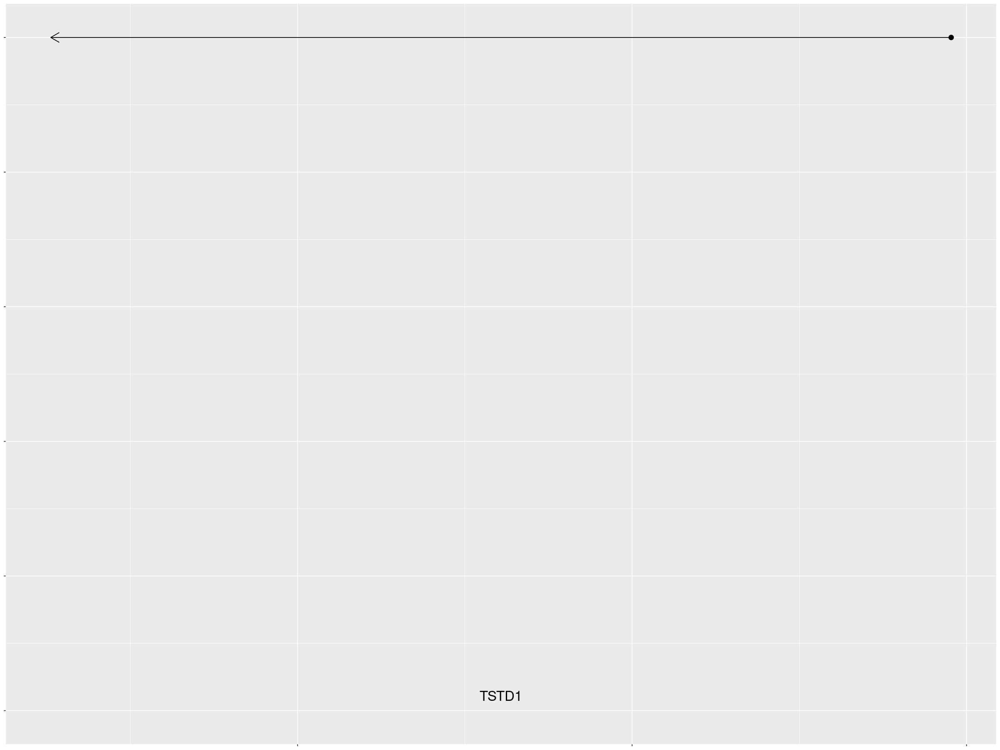

In [656]:
refine_plot =tmp4%>%filter(str_detect(snp,"chr22:") )


In [657]:
refine_plot%>%count(molecular_trait_id)

molecular_trait_id,n
<chr>,<int>
Exc APOL2,3099
Inh APOL2,3099
eQTL APOL2,3099
haQTL tad1411,3099
mQTL tad1411,3099
pQTL 22_APOL2_Q9BQE5,3099


In [37]:
gene_plot75  = read_delim("4_tad1411gene_info.tsv")%>%mutate(strand = strand%>%as.factor%>%as.numeric)
gene_plot75 = gene_plot75%>%filter(gene_name %in% c("APOL2"))
gene_plot75

Rows: 657 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): #chr, strand, gene_id, gene_name, gene_type
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


#chr,strand,start,end,gene_id,gene_name,gene_type
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
chr22,1,36239954,36226209,ENSG00000128335,APOL2,protein_coding


In [39]:
gene_plot75  = read_delim("4_tad1411gene_info.tsv")%>%mutate(strand = strand%>%as.factor%>%as.numeric)


Rows: 657 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): #chr, strand, gene_id, gene_name, gene_type
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [41]:
gene_plot75 = gene_plot75%>%filter(start> 36000000,end < 36250000)

In [52]:
gene_plot75

#chr,strand,start,end,gene_id,gene_name,gene_type,x_label
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>
chr1,1,36013630,35992109,ENSG00000271554,AL138787.2,lncRNA,36002870
chr1,1,36084026,36080066,ENSG00000232862,AL138787.1,transcribed_processed_pseudogene,36082046
chr1,2,36084094,36088275,ENSG00000092850,TEKT2,protein_coding,36086184
chr1,2,36088892,36093932,ENSG00000116863,ADPRS,protein_coding,36091412
chr1,1,36125222,36095239,ENSG00000171812,COL8A2,protein_coding,36110230
chr1,1,36156053,36136570,ENSG00000054116,TRAPPC3,protein_coding,36146312
chr1,2,36155579,36180849,ENSG00000116871,MAP7D1,protein_coding,36168214
chr1,2,36191915,36192170,ENSG00000264592,RN7SL131P,misc_RNA,36192042
chr1,1,36242156,36241898,ENSG00000231849,UBE2V2P4,processed_pseudogene,36242027


In [170]:
annotation%>%filter(chr == "chr22:",start1 > 36000000 , start1 < 36226209 ,start2 <36300000  ,type =="Neu"  ,start2 > 36226209)

chr1,start1,end1,chr2,start2,end2,count,expected,fdr,ClusterLabel,ClusterSize,ClusterType,ClusterNegLog10P,ClusterSummit,type
<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
chr1,36025000,36030000,chr1,36230000,36235000,16,5.686221,4.178031e-03,chr1_107,12,SharpPeak,68.631217,0,Neu
chr1,36035000,36040000,chr1,36230000,36235000,23,4.078198,5.371093e-09,chr1_107,12,SharpPeak,68.631217,1,Neu
chr1,36035000,36040000,chr1,36235000,36240000,16,3.679428,4.161039e-05,chr1_107,12,SharpPeak,68.631217,0,Neu
chr1,36040000,36045000,chr1,36235000,36240000,11,3.299153,6.999200e-03,chr1_107,12,SharpPeak,68.631217,0,Neu
chr1,36035000,36040000,chr1,36240000,36245000,17,2.671471,3.637445e-07,chr1_107,12,SharpPeak,68.631217,0,Neu
chr1,36040000,36045000,chr1,36240000,36245000,11,2.504591,1.667135e-03,chr1_107,12,SharpPeak,68.631217,0,Neu
chr1,36035000,36040000,chr1,36245000,36250000,12,3.338735,4.474574e-03,chr1_107,12,SharpPeak,68.631217,0,Neu
chr1,36040000,36045000,chr1,36245000,36250000,13,3.102105,7.501105e-04,chr1_107,12,SharpPeak,68.631217,0,Neu
chr1,36025000,36030000,chr1,36250000,36255000,12,3.677831,9.148814e-03,chr1_107,12,SharpPeak,68.631217,0,Neu


In [30]:
plot_range = c(35320601,36478909)

Rows: 657 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): #chr, strand, gene_id, gene_name, gene_type
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Warning message:
“Duplicated aesthetics after name standardisation: colour”


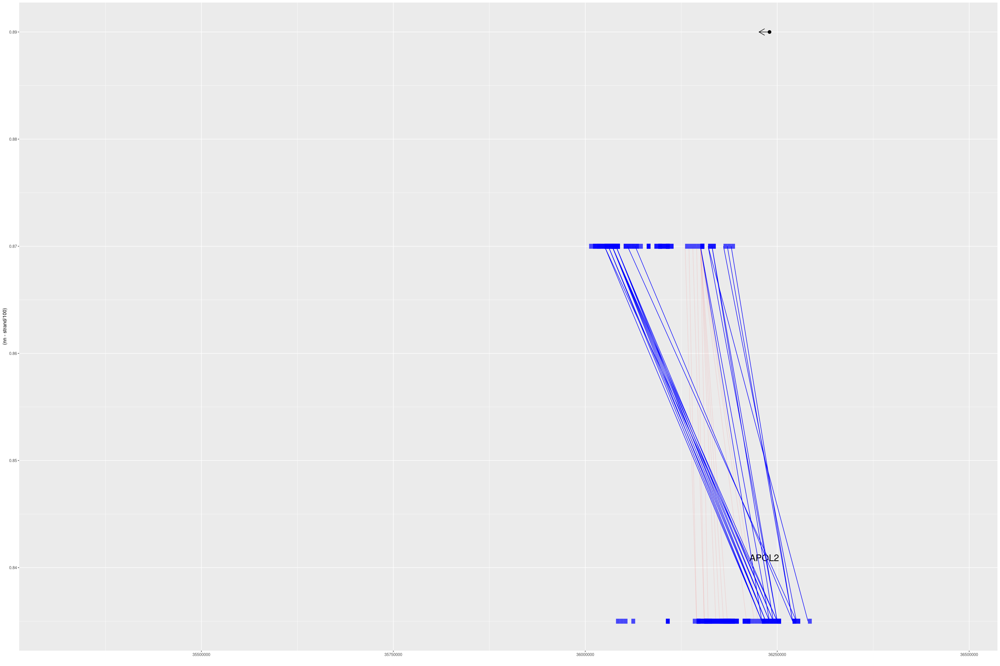

In [168]:
gene_plot75  = read_delim("4_tad1411gene_info.tsv")%>%mutate(strand = strand%>%as.factor%>%as.numeric)
gene_plot75 = gene_plot75%>%filter(gene_id %in% c("ENSG00000128335"))
#gene_plot75 = gene_plot75%>%filter(start> 36000000,end < 36250000)
chr = "chr22:"
#gene_plot[4,] = gene_plot[3,]
#gene_plot[4,] = list("chr15",34075155,33858782, "ENSG00000169857" , "AVEN" ,2,2 )
gene_plot75$x_label <- (0.5*(gene_plot75$end-gene_plot75$start)+gene_plot75$start)
#gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")] <- gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")]+20000
nn = 0.9
gene_plot_plot <-ggplot(gene_plot75,aes()) +
  geom_segment( aes(x = start,xend = end, y = (nn-strand/100), yend =(nn-strand/100) ) ,
                arrow = arrow(length = unit(0.5, "cm")) )+
  geom_text(aes(x = x_label,y = (nn-0.05-strand/100), label = gene_name, vjust=-1),
            size = 7)+
  xlab("")+
  theme(legend.position="none")+
  xlim(plot_range)+
  geom_point(aes(x = start, y = (nn-strand/100)),
             color = "black",size = 3  )+        
        geom_segment( color = "red",aes(x = start1,xend = start2, y = 0.87 , yend = 0.835 ),alpha = 0.1,size = 0.5,  annotation%>%filter(chr == chr,start1 > 36125000 , start1 < 36226209 ,start2 <36300000  , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu"  )%>%rename( end = end2, chr = chr1)  ) +
    geom_segment( color = "blue",aes(color = type,x = start,xend = end, y = 0.87, yend =  0.87),alpha = 0.7,size = 5, data = annotation%>%filter(chr == chr,start1 > 36000000 , start1 < 36226209 ,start2 <36300000  , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu"  )%>%rename(start = start1, end = end1, chr = chr1)  ) +
    geom_segment( color = "blue",aes(color = type,x = start,xend = end, y = 0.835, yend =  0.835),alpha = 0.7,size = 5, data = annotation%>%filter(chr == chr,start1 > 36000000 , start1 < 36226209 ,start2 <36300000  , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu")%>%rename(start = start2, end = end2, chr = chr1)  ) +
    geom_segment( color = "blue",aes(x = start1,xend = start2, y = 0.87 , yend = 0.835 ),alpha = 1,size = 0.5, color  = "purple",  annotation%>%filter(chr == chr,start1 > 36000000 , start1 < 36226209 ,start2 <36300000, start2 > 36226209  , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu"  )%>%rename( end = end2, chr = chr1)  ) 

gene_plot_plot

In [169]:
chr

[1] "chr22:"

In [161]:
0.5*(36000000 + 36250000)

[1] 36125000

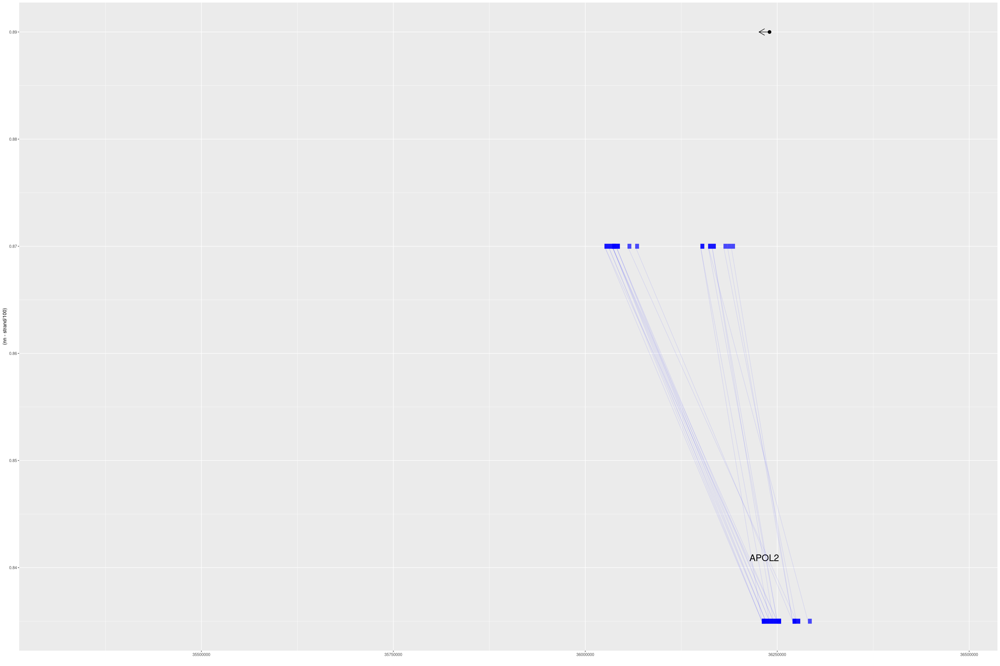

In [153]:
gene_plot_plot

Warning message:
“Removed 1560 rows containing missing values (`geom_segment()`).”


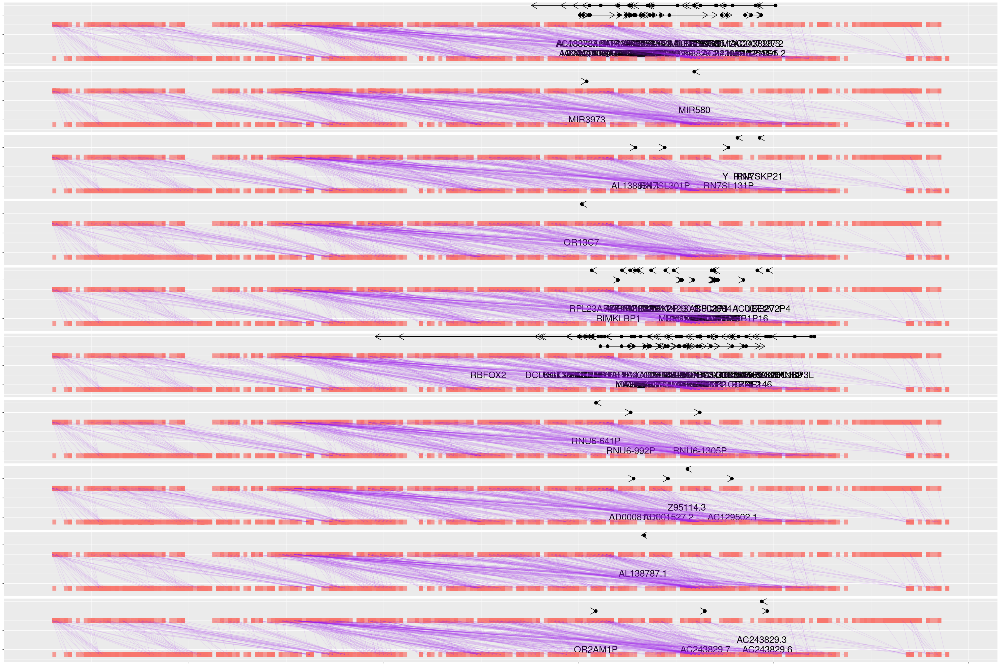

In [110]:
gene_plot_plot+facet_grid(gene_type~.)

In [83]:
annotation%>%select(type,start = start2,start1, end = end2, chr = chr1)%>%filter(chr =="chr22", start1 >= 36239954-5000  , end <=36226209+5000 ,type == "Neu")

type,start,start1,end,chr
<chr>,<dbl>,<dbl>,<dbl>,<chr>


Rows: 657 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): #chr, strand, gene_id, gene_name, gene_type
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


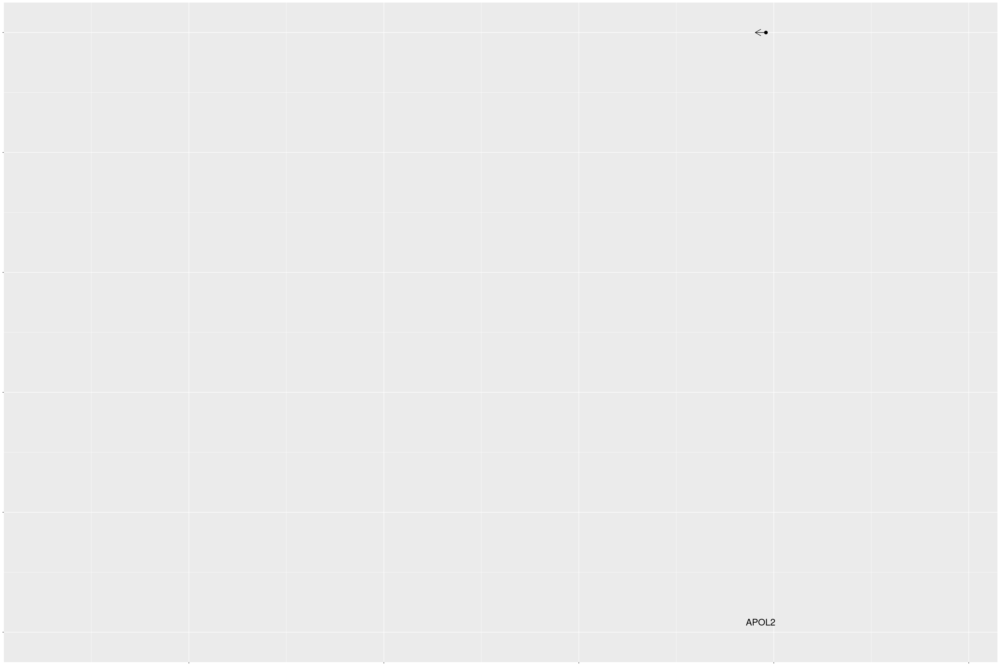

In [86]:
gene_plot75  = read_delim("4_tad1411gene_info.tsv")%>%mutate(strand = strand%>%as.factor%>%as.numeric)
gene_plot75 = gene_plot75%>%filter(gene_id %in% c("ENSG00000128335"))
#gene_plot75 = gene_plot75%>%filter(start> 36000000,end < 36250000)
chr = "chr22:"
#gene_plot[4,] = gene_plot[3,]
#gene_plot[4,] = list("chr15",34075155,33858782, "ENSG00000169857" , "AVEN" ,2,2 )
gene_plot75$x_label <- (0.5*(gene_plot75$end-gene_plot75$start)+gene_plot75$start)
#gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")] <- gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")]+20000
nn = 0.9
gene_plot_plot <-ggplot(gene_plot75,aes()) +
  geom_segment( aes(x = start,xend = end, y = (nn-strand/100), yend =(nn-strand/100) ) ,
                arrow = arrow(length = unit(0.5, "cm")) )+
  geom_text(aes(x = x_label,y = (nn-0.05-strand/100), label = gene_name, vjust=-1),
            size = 7)+
  ylab("")+
  xlab("")+
  theme(legend.position="none")+
  theme(text = element_blank())+
  xlim(plot_range)+
  geom_point(aes(x = start, y = (nn-strand/100)),
             color = "black",size = 3  )+        
    geom_segment( aes(color = type,x = start,xend = end, y = 0.87, yend =  0.87),alpha = 0.7,size = 5, data = annotation%>%filter(chr =="chr22", type == "Neu",ClusterLabel == "chr22_117")%>%select(type,start = start1, end = end1, chr = chr1)%>%filter(chr =="chr22", type == "Neu")        ) +
    geom_segment( aes(color = type,x = start,xend = end, y = 0.835, yend =  0.835),alpha = 0.7,size = 5, data = annotation%>%filter(chr =="chr22", type == "Neu",ClusterLabel == "chr22_117")%>%select(type,start = start2,start1, end = end2, chr = chr1)%>%filter(chr =="chr22", type == "Neu")        ) +
    geom_segment( aes(x = start1,xend = start2, y = 0.87 , yend = 0.835 ),alpha = 0.1,size = 0.5, color  = "purple",  annotation%>%filter(chr =="chr22", type == "Neu",ClusterLabel == "chr22_117")%>%select(type, start2,start1,,end1,end2,  chr = chr1)%>%filter(chr =="chr22", type == "Neu")) 
gene_plot_plot


In [173]:
chr

[1] "chr22"

In [177]:
 annotation%>%select(type, start2,start1,  chr = chr1)%>%filter(chr == chr_select, start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu"  )  

type,start2,start1,chr
<chr>,<dbl>,<dbl>,<chr>
Neu,36445000,36425000,chr22
Neu,36470000,35745000,chr22
Neu,36515000,35980000,chr22
Neu,36515000,36020000,chr22
Neu,36520000,36020000,chr22
Neu,35980000,35745000,chr22
Neu,35975000,35745000,chr22
Neu,35985000,35745000,chr22
Neu,36470000,36460000,chr22


In [192]:
annotation%>%filter(chr == chr_select,start1 > 36125000 , start1 < 36226209 ,start2 <36300000 ,start2 > 36226209 , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu"  )

chr1,start1,end1,chr2,start2,end2,count,expected,fdr,ClusterLabel,ClusterSize,ClusterType,ClusterNegLog10P,ClusterSummit,type
<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
chr5,36150000,36155000,chr5,36240000,36245000,52,21.454539,6.041387e-07,chr5_17,5,SharpPeak,27.19955,1,Neu
chr5,36150000,36155000,chr5,36230000,36235000,27,10.628976,6.499456e-04,chr5_17,5,SharpPeak,27.19955,0,Neu
chr6,36165000,36170000,chr6,36245000,36250000,15,4.940780,4.787056e-03,chr6_415,3,SharpPeak,13.95672,0,Neu
chr6,36160000,36165000,chr6,36250000,36255000,20,7.652808,4.188234e-03,chr6_415,3,SharpPeak,13.95672,0,Neu
chr6,36165000,36170000,chr6,36250000,36255000,17,4.842770,5.121209e-04,chr6_415,3,SharpPeak,13.95672,1,Neu
chr6,36160000,36165000,chr6,36290000,36295000,17,5.102249,8.939977e-04,chr6_416,2,SharpPeak,12.57426,0,Neu
chr11,36185000,36190000,chr11,36270000,36275000,18,5.523023,7.274841e-04,chr11_677,3,SharpPeak,16.19146,0,Neu
chr11,36190000,36195000,chr11,36270000,36275000,17,5.896189,3.855510e-03,chr11_677,3,SharpPeak,16.19146,0,Neu
chr11,36180000,36185000,chr11,36275000,36280000,20,5.353799,5.403162e-05,chr11_677,3,SharpPeak,16.19146,1,Neu


In [100]:
e16%>%filter(variants == "chr22:36239399_A_G")

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end,cs_size
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>


In [42]:
chr_select

[1] "chr22"

In [69]:
annotation%>%filter(chr1 == "chr22",start1 > 36000000 , start1 < 36226209 , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu")

chr1,start1,end1,chr2,start2,end2,count,expected,fdr,ClusterLabel,ClusterSize,ClusterType,ClusterNegLog10P,ClusterSummit,type
<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
chr22,36020000,36025000,chr22,36515000,36520000,9,1.815663,1.971948e-03,chr22_30,6,SharpPeak,26.614781,0,Neu
chr22,36020000,36025000,chr22,36520000,36525000,8,1.569901,3.452911e-03,chr22_30,6,SharpPeak,26.614781,0,Neu
chr22,36130000,36135000,chr22,36420000,36425000,11,2.821629,5.184681e-03,chr22_189,2,SharpPeak,11.575671,0,Neu
chr22,36145000,36150000,chr22,36425000,36430000,15,2.834892,2.817410e-05,chr22_189,2,SharpPeak,11.575671,1,Neu
chr22,36185000,36190000,chr22,36425000,36430000,14,3.324761,5.649606e-04,chr22_190,2,SharpPeak,9.712614,1,Neu
chr22,36200000,36205000,chr22,36425000,36430000,12,3.510051,8.493677e-03,chr22_190,2,SharpPeak,9.712614,0,Neu
chr22,36140000,36145000,chr22,36460000,36465000,12,2.749979,1.286975e-03,chr22_192,2,SharpPeak,11.429618,0,Neu
chr22,36150000,36155000,chr22,36460000,36465000,14,2.930637,1.617583e-04,chr22_192,2,SharpPeak,11.429618,1,Neu
chr22,36015000,36020000,chr22,36515000,36520000,10,1.932875,1.299447e-03,chr22_30,6,SharpPeak,26.614781,1,Neu


In [59]:
refine_plot =tmp4%>%filter(str_detect(snp,chr_select) )
plot_range = c(min(refine_plot$pos),max(refine_plot$pos))
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"haQTL"))]<- "H3K9ac"
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"mQTL"))]<- "DNAm"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="pQTL 22_APOL2_Q9BQE5" )]<- "pQTL APOL2"
refine_plot$molecular_trait_id <- factor(refine_plot$molecular_trait_id,level = c(level = c("Exc APOL2","Inh APOL2","eQTL APOL2","pQTL APOL2","H3K9ac","DNAm")))
color = color2 = c("black", "dodgerblue2","green4","#6A3D9A","skyblue2", "#FF7F00",
                   "gold1",  "#FB9A99", "palegreen2",
                   "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
                   "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
                   "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
                   "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
                   "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")
##### Change coloring of non-overlap CS
#refine_plot%>%mutate(new_CS = case_when(molecular_trait_id == "Oli TMEM131L" & new_CS == 2 ~  9,
#                                    molecular_trait_id == "H3K9ac" & new_CS == 2 ~  10,
#                                     molecular_trait_id == "DNAm" & !Shared & new_CS == 1 ~  11,
#                                    .default = new_CS 
#                                   ))-> refine_plot

#### Add sign annotation, see pseudobulk notebook for code to gather this info
#sign = 
# refine_plot%>%group_by(molecular_trait_id, new_CS)%>%
#    summarize(pos = max(pos[which(y == max(y))]), y = max(y))%>%filter(new_CS != 0)%>%
#    filter(!molecular_trait_id%in% c("H3K9ac", "DNAm")) %>%ungroup%>%mutate(sign = c("-","-","-","+","-") )
#refine_plot = left_join(refine_plot,sign)
#

### Add sign annotation, see pseudobulk notebook for code to gather this info
sign = 
refine_plot%>%group_by(molecular_trait_id, new_CS)%>%
    summarize(pos = max(pos[which(y == max(y))]), y = max(y))%>%filter(new_CS != 0)%>%
    filter(molecular_trait_id%in% c("eQTL APOL2", "pQTL APOL2"),new_CS == 1) %>%ungroup%>%mutate(sign = c("+","+") )

`summarise()` has grouped output by 'molecular_trait_id'. You can override
using the `.groups` argument.


In [81]:
refine_plot =tmp4%>%filter(str_detect(snp,chr_select) )
plot_range = c(min(refine_plot$pos),max(refine_plot$pos))
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"haQTL"))]<- "H3K9ac"
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"mQTL"))]<- "DNAm"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="pQTL 22_APOL2_Q9BQE5" )]<- "pQTL APOL2"
refine_plot$molecular_trait_id <- factor(refine_plot$molecular_trait_id,level = c(level = c("Exc APOL2","Inh APOL2","eQTL APOL2","pQTL APOL2","H3K9ac","DNAm")))


In [86]:
refine_plot =tmp4%>%filter(str_detect(snp,chr_select) )
plot_range = c(min(refine_plot$pos),max(refine_plot$pos))
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"haQTL"))]<- "H3K9ac"
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"mQTL"))]<- "DNAm"
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"Exc"))]<- "Exc eQTL APOL2"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="pQTL 22_APOL2_Q9BQE5" )]<- "pQTL APOL2"

In [98]:
refine_plot%>%filter(y >= 0.7)

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<dbl>,<chr>,<lgl>,<dbl>
0.9999969,chr22:36236979_C_T,36236979,2,Exc eQTL_APOL2_ENSG00000128335,FALSE,2
0.9370005,chr22:36239399_A_G,36239399,0,Exc eQTL_APOL2_ENSG00000128335,FALSE,0
1.0000000,chr22:36239710_G_A,36239710,1,Exc eQTL_APOL2_ENSG00000128335,TRUE,1
0.9999969,chr22:36236979_C_T,36236979,2,Exc eQTL_APOL2_ENSG00000128335,FALSE,2
0.9370005,chr22:36239399_A_G,36239399,0,Exc eQTL_APOL2_ENSG00000128335,FALSE,0
1.0000000,chr22:36239710_G_A,36239710,1,Exc eQTL_APOL2_ENSG00000128335,TRUE,1
1.0000000,chr22:36239710_G_A,36239710,1,Exc eQTL_APOL2_ENSG00000128335,TRUE,1
1.0000000,chr22:36239710_G_A,36239710,1,pQTL 22_APOL2_Q9BQE5,TRUE,1
1.0000000,chr22:36239710_G_A,36239710,1,eQTL APOL2,TRUE,1


In [97]:
refine_plot =tmp4%>%filter(str_detect(snp,chr_select) )

refine_plot%>%filter(CS != 0)

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<dbl>,<chr>,<lgl>,<dbl>
0.99999691,chr22:36236979_C_T,36236979,2,Exc eQTL_APOL2_ENSG00000128335,FALSE,2
1.00000000,chr22:36239710_G_A,36239710,1,Exc eQTL_APOL2_ENSG00000128335,TRUE,1
0.99999691,chr22:36236979_C_T,36236979,2,Exc eQTL_APOL2_ENSG00000128335,FALSE,2
1.00000000,chr22:36239710_G_A,36239710,1,Exc eQTL_APOL2_ENSG00000128335,TRUE,1
1.00000000,chr22:36239710_G_A,36239710,1,Exc eQTL_APOL2_ENSG00000128335,TRUE,1
0.25117536,chr22:36214547_AAGT_A,36214547,2,pQTL 22_APOL2_Q9BQE5,FALSE,2
0.25117536,chr22:36218366_G_A,36218366,2,pQTL 22_APOL2_Q9BQE5,FALSE,2
0.25117536,chr22:36226776_G_T,36226776,2,pQTL 22_APOL2_Q9BQE5,FALSE,2
0.25117536,chr22:36226782_TC_T,36226782,2,pQTL 22_APOL2_Q9BQE5,FALSE,2


Rows: 657 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): #chr, strand, gene_id, gene_name, gene_type
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Warning message:
“Duplicated aesthetics after name standardisation: colour”
Warning message:
“Duplicated aesthetics after name standardisation: colour”
Warning message:
“Removed 17 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 12 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 12 rows containing missing values (`geom_segment()`).”


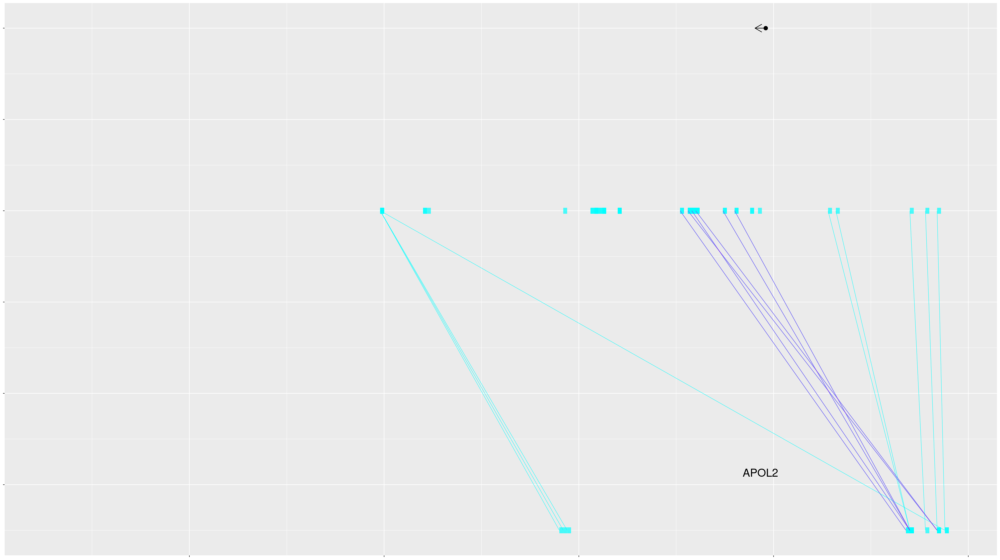

`summarise()` has grouped output by 'molecular_trait_id'. You can override
using the `.groups` argument.
Joining with `by = join_by(y, pos, molecular_trait_id, new_CS)`



Neu eQTL APOL2      Inh APOL2     eQTL APOL2     pQTL APOL2         H3K9ac 
          6075              0           3099           3099           3099 
          DNAm 
          3099 

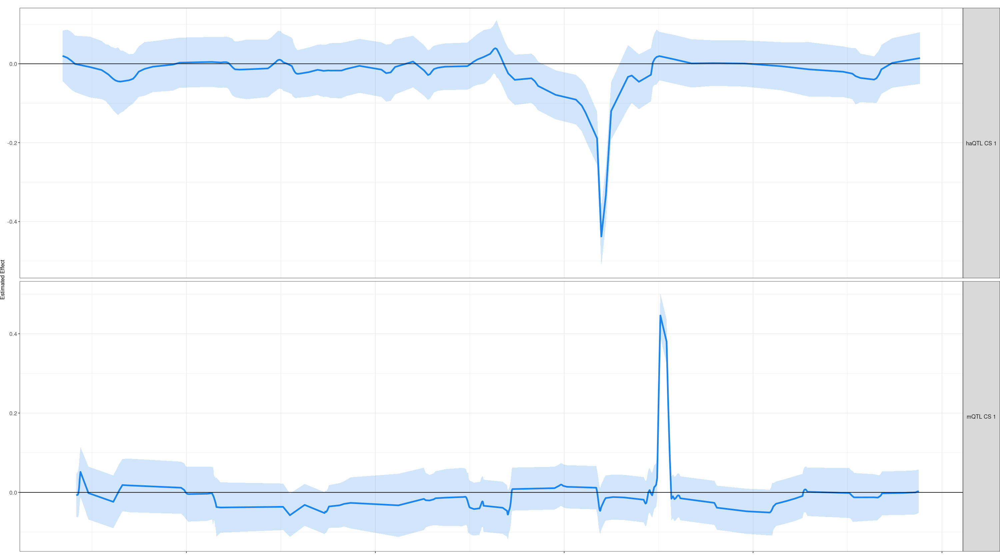

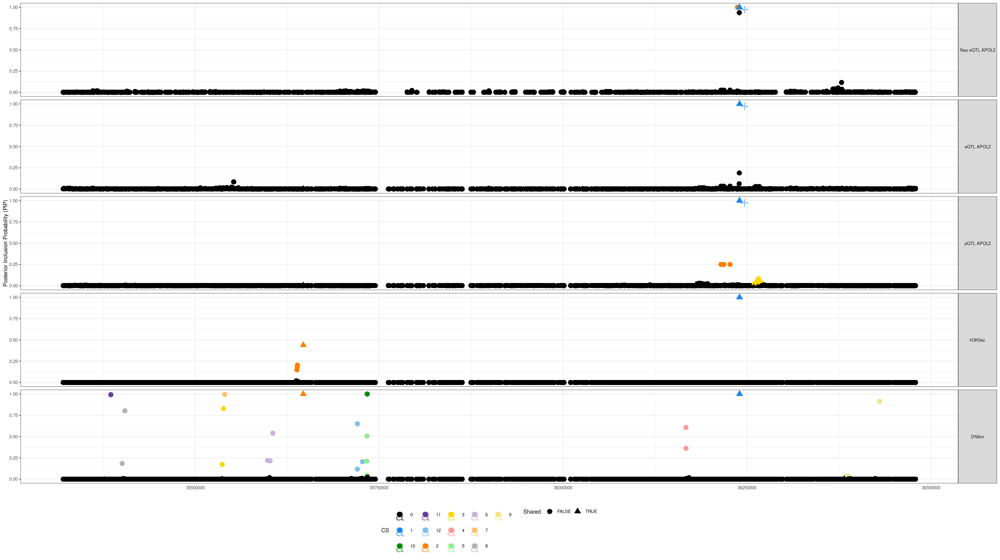

Warning message:
“Removed 17 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 12 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 12 rows containing missing values (`geom_segment()`).”


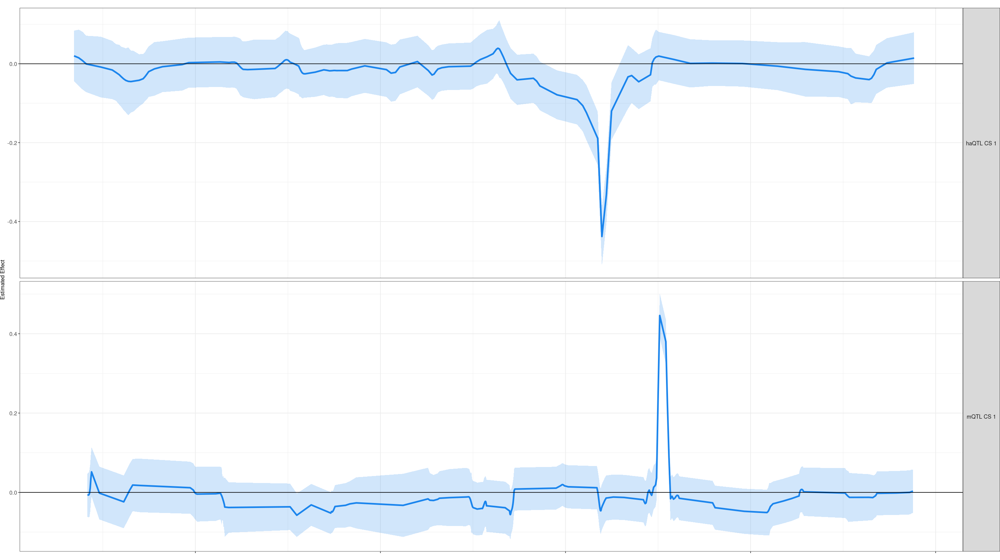

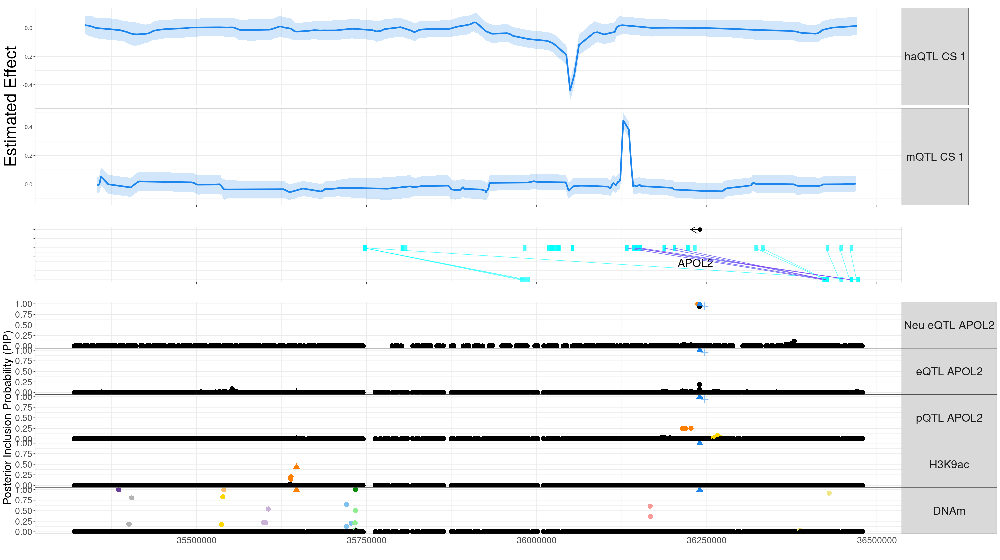

In [112]:
gene_plot75  = read_delim("4_tad1411gene_info.tsv")%>%mutate(strand = strand%>%as.factor%>%as.numeric)
gene_plot75 = gene_plot75%>%filter(gene_id %in% c("ENSG00000128335"))
#gene_plot75 = gene_plot75%>%filter(start> 36000000,end < 36250000)
chr_select = "chr22"
#gene_plot[4,] = gene_plot[3,]
#gene_plot[4,] = list("chr15",34075155,33858782, "ENSG00000169857" , "AVEN" ,2,2 )
gene_plot75$x_label <- (0.5*(gene_plot75$end-gene_plot75$start)+gene_plot75$start)
#gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")] <- gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")]+20000
nn = 0.9
gene_plot_plot <-ggplot(gene_plot75,aes()) +
  geom_segment( aes(x = start,xend = end, y = (nn-strand/100), yend =(nn-strand/100) ) ,
                arrow = arrow(length = unit(0.5, "cm")) )+
  geom_text(aes(x = x_label,y = (nn-0.05-strand/100), label = gene_name, vjust=-1),
            size = 7)+
  ylab("")+
  xlab("")+
  theme(legend.position="none")+
  theme(text = element_blank())+
  xlim(plot_range)+
  geom_point(aes(x = start, y = (nn-strand/100)),
             color = "black",size = 3  )+        
    geom_segment(color = "cyan", aes(color = type,x = start,xend = end, y = 0.87, yend =  0.87),alpha = 0.7,size = 5, data = annotation%>%select(type,start = start1, end = end1, chr = chr1)%>%filter(chr == chr_select, start > plot_range[[1]],start < plot_range[[2]],type =="Neu"  )  ) +
    geom_segment(color = "cyan", aes(color = type,x = start,xend = end, y = 0.835, yend =  0.835),alpha = 0.7,size = 5, data = annotation%>%select(type,start = start2,start1, end = end2, chr = chr1)%>%filter(chr == chr_select, start > plot_range[[1]],start < plot_range[[2]],type =="Neu"  )  ) +
    geom_segment(color = "cyan", aes(x = start1,xend = start2, y = 0.87 , yend = 0.835 ),alpha = 0.7,size = 0.4, color  = "purple",  annotation%>%select(type, start2,start1,  chr = chr1)%>%filter(chr == chr_select, start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu"  )  ) +
    geom_segment( color = "red",aes(x = start1,xend = start2, y = 0.87 , yend = 0.835 ),alpha = 0.1,size = 0.5,  annotation%>%filter(chr1 == chr_select,start1 > 36125000 , start1 < 36226209 ,start2 < 36226209  , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu"  )%>%rename( end = end2, chr = chr1)  ) +
    geom_segment( color = "red",aes(x = start,xend = end, y = 0.87, yend =  0.87),alpha = 0.7,size = 5, data = annotation%>%filter(chr1 == chr_select,start1 > 36125000,start1 > 36000000 , start1 < 36226209 ,start2 <36226209  , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu"  )%>%rename(start = start1, end = end1, chr = chr1)  ) +
    geom_segment( color = "red",aes(x = start,xend = end, y = 0.835, yend =  0.835),alpha = 0.7,size = 5, data = annotation%>%filter(chr1 == chr_select,start1 > 36125000,start1 > 36125000 , start1 < 36226209 ,start2 <36226209  , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu"  )%>%rename(start = start2, end = end2, chr = chr1)  ) +     
    geom_segment( color = "cyan",aes(x = start,xend = end, y = 0.87, yend =  0.87),alpha = 0.7,size = 5, data = annotation%>%filter(chr1 == chr_select,start1 > 36000000 , start1 < 36226209 , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu"  )%>%rename(start = start1, end = end1, chr = chr1)  ) +
    geom_segment( color = "cyan",aes(x = start,xend = end, y = 0.835, yend =  0.835),alpha = 0.7,size = 5, data = annotation%>%filter(chr1 == chr_select,start1 > 36000000 , start1 < 36226209 , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu")%>%rename(start = start2, end = end2, chr = chr1)  ) +
    geom_segment( color = "purple",aes(x = start1,xend = start2, y = 0.87 , yend = 0.835 ),alpha = 0.6,size = 0.5, color  = "purple",  annotation%>%filter(chr1 == chr_select,start1 > 36000000 , start1 < 36226209  , start1 > plot_range[[1]],start1 < plot_range[[2]],type =="Neu"  )%>%rename( end = end2, chr = chr1)  ) 

gene_plot_plot


library("dplyr")
library("readr")
library("stringr")
library("purrr")
library("tidyr")
library("ggplot2")
library("cowplot")
library("ComplexUpset")
n = c(1,2,3,4)
color = color2 = c("black", "dodgerblue2", "#6A3D9A","#FF7F00","skyblue2","#6A3D9A",
                   "gold1",  "#FB9A99", "palegreen2",
                   "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
                   "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
                   "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
                   "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
                   "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")




#refine_effect_plot =  read_delim(paste(path,"4_1182_effect.tsv", sep=""))
refine_effect_plot<-  ggplot( effect1411  )+
  geom_line(aes(x = pos, y = mid,color = effect), size=1.4)+
  geom_ribbon(aes(x = pos,
                  y = mid,
                  ymin = low,
                  ymax = up,
                  fill = effect),
              alpha = 0.2)+
  ylab("Estimated Effect") +
  xlab("POS")+
  facet_grid(factor(type,levels =  c("haQTL_Effect_1",
                                     "mQTL_Effect_1"
                                     ),
                    labels =   c("haQTL CS 1",
                                 "mQTL CS 1")
  )~., scales = "free" )+
  scale_color_manual("Credible set",values = color2[n+1])+
  geom_hline(aes(yintercept = 0), color = "black")+
  scale_fill_manual("Credible set",values = color2[n+1])+
  theme_bw()+
  xlab("") +
  ylab("Estimated Effect")+
  theme(text = element_text(size = 10),
        legend.position="none")+
  theme(plot.margin=unit(c(5,0,0,0),"mm"),
        strip.text.y.right = element_text(angle = 0,
                                          size = 10),
        axis.text.x = element_blank(),
        axis.text.y = element_text(size = 10)
  )


refine_effect_plot


refine_plot =tmp4%>%filter(str_detect(snp,chr_select) )
plot_range = c(min(refine_plot$pos),max(refine_plot$pos))
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"haQTL"))]<- "H3K9ac"
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"mQTL"))]<- "DNAm"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="pQTL 22_APOL2_Q9BQE5" )]<- "pQTL APOL2"
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"Exc"))]<- "Neu eQTL APOL2"
refine_plot$molecular_trait_id <- factor(refine_plot$molecular_trait_id,level = c(level = c("Neu eQTL APOL2","Inh APOL2","eQTL APOL2","pQTL APOL2","H3K9ac","DNAm")))
refine_plot = refine_plot%>%filter(!is.na(molecular_trait_id))
color = color2 = c("black", "dodgerblue2","green4","#6A3D9A","skyblue2", "#FF7F00",
                   "gold1",  "#FB9A99", "palegreen2",
                   "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
                   "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
                   "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
                   "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
                   "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")
##### Change coloring of non-overlap CS
#refine_plot%>%mutate(new_CS = case_when(molecular_trait_id == "Oli TMEM131L" & new_CS == 2 ~  9,
#                                    molecular_trait_id == "H3K9ac" & new_CS == 2 ~  10,
#                                     molecular_trait_id == "DNAm" & !Shared & new_CS == 1 ~  11,
#                                    .default = new_CS 
#                                   ))-> refine_plot

#### Add sign annotation, see pseudobulk notebook for code to gather this info
#sign = 
# refine_plot%>%group_by(molecular_trait_id, new_CS)%>%
#    summarize(pos = max(pos[which(y == max(y))]), y = max(y))%>%filter(new_CS != 0)%>%
#    filter(!molecular_trait_id%in% c("H3K9ac", "DNAm")) %>%ungroup%>%mutate(sign = c("-","-","-","+","-") )
#refine_plot = left_join(refine_plot,sign)
#

### Add sign annotation, see pseudobulk notebook for code to gather this info
sign = 
refine_plot%>%group_by(molecular_trait_id, new_CS)%>%
    summarize(pos = max(pos[which(y == max(y))]), y = max(y))%>%filter(new_CS != 0)%>%
    filter(molecular_trait_id%in% c("eQTL APOL2", "pQTL APOL2","Neu eQTL APOL2"),new_CS == 1) %>%ungroup%>%mutate(sign = c("+") )

refine_plot = left_join(refine_plot,sign)


table(refine_plot$molecular_trait_id )
refine_plot  <-  ggplot2::ggplot(refine_plot,aes(y = y,
                                                 x = pos,
                                                 col =  as.factor(new_CS))) +
  geom_text(alpha = 0.5, aes(x =pos + 7000, y = y ,color =  as.factor(new_CS), label = sign ) ,data = sign, size = 10)+
  facet_grid(molecular_trait_id ~.)+
  geom_point(size = 4,aes(
                                                 shape = Shared )) +
  scale_color_manual("CS",values = color) +
  theme_bw()+
  theme(axis.ticks.x = element_blank()) +
  ylab("Posterior Inclusion Probability (PIP)")+
  xlim(plot_range)+
  theme(axis.ticks.x = element_blank() ) +
  theme(strip.text.y.right = element_text(angle = 0))+
  xlab("") +
  theme(text = element_text(size = 10),legend.position = "bottom")
refine_plot


refine_effect_plot+
  xlim(plot_range)










cowplot::plot_grid(plotlist = list(refine_effect_plot+theme(strip.text.y.right = element_text(angle = 0,size = 20))+
                                     xlim(plot_range)+
                                     theme(text = element_text(size = 30)),#microglia_enhancer_activity,#+facet_grid(TargetGene_name~., scales = "free"),
                                   gene_plot_plot+
                                     theme_bw()+
                                     theme(axis.text.x = element_blank(),
                                           axis.text.y = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0))+
                                     xlab("")+
                                     theme(text = element_text(size = 20)),
                                   refine_plot+
                                     theme_bw()+
                                     theme(axis.ticks.x = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0,size = 20))+
                                     xlab("") +ylim(c(0,1))+
                                     theme(text = element_text(size = 20),
                                           panel.spacing=unit(0, "lines"),legend.position = "none")
                                   
) ,
ncol = 1,
align = "v",
axis = "tlbr",
rel_heights = c(6,2,7)
)

In [109]:
options(repr.plot.width =25, repr.plot.height = 14)

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Warning message:
“Removed 17 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 12 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 12 rows containing missing values (`geom_segment()`).”


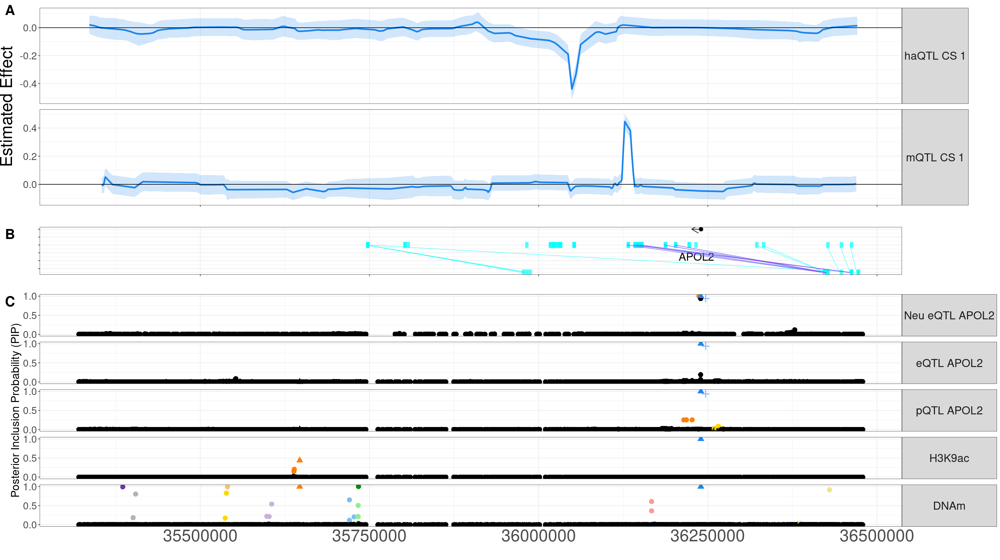

In [113]:
cowplot::plot_grid(plotlist = list(refine_effect_plot+theme(strip.text.y.right = element_text(angle = 0,size = 20),axis.text.y = element_text(size = 18), 
                                           panel.spacing=unit(0.7, "lines"))+
                                     xlim(plot_range)+
                                     theme(text = element_text(size = 30)),#microglia_enhancer_activity,#+facet_grid(TargetGene_name~., scales = "free"),
                                   gene_plot_plot+
                                     theme_bw()+
                                     theme(axis.text.x = element_blank(),
                                           axis.text.y = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0))+
                                     xlab("")+
                                     theme(text = element_text(size = 20)),
                                   refine_plot+
                                     theme_bw()+
                                     theme(axis.ticks.x = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0,size = 20))+
                                     xlab("") +ylim(c(0,1))+theme(text = element_text(size = 20),axis.text.x = element_text(size = 30), axis.text.y = element_text(size = 18), 
                                           panel.spacing=unit(0.7, "lines"),legend.position = "none")+scale_y_continuous(breaks = c(0,0.5,1))
                                   
) ,
ncol = 1,
align = "v",
axis = "tlbr",
rel_heights = c(5,1.5,6),labels  = c("A","B","C"),label_size = 25
)

In [111]:
annotation 

chr1,start1,end1,chr2,start2,end2,count,expected,fdr,ClusterLabel,ClusterSize,ClusterType,ClusterNegLog10P,ClusterSummit,type
<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
chr1,955000,960000,chr1,965000,970000,45,20.298997,6.811625e-05,chr1_01,1,Singleton,6.171725,1,Neu
chr1,3770000,3775000,chr1,4715000,4720000,15,3.105499,2.449255e-05,chr1_02,1,Singleton,6.688851,1,Neu
chr1,11320000,11325000,chr1,11740000,11745000,15,3.324001,5.219703e-05,chr1_03,1,Singleton,6.308568,1,Neu
chr1,23665000,23670000,chr1,23960000,23965000,15,3.320579,5.175136e-05,chr1_04,1,Singleton,6.314290,1,Neu
chr1,26485000,26490000,chr1,26495000,26500000,64,31.447124,1.423320e-05,chr1_05,1,Singleton,6.954796,1,Neu
chr1,27715000,27720000,chr1,27960000,27965000,19,3.801789,8.928120e-07,chr1_06,1,Singleton,8.341842,1,Neu
chr1,32965000,32970000,chr1,33005000,33010000,47,11.415577,4.696426e-13,chr1_07,1,Singleton,15.177320,1,Neu
chr1,33720000,33725000,chr1,33935000,33940000,28,4.612536,1.291996e-11,chr1_08,1,Singleton,13.619100,1,Neu
chr1,33855000,33860000,chr1,33935000,33940000,26,7.093182,1.669856e-06,chr1_09,1,Singleton,8.019209,1,Neu


In [59]:
gene_plot75%>%filter(gene_id %in% c("ENSG00000128335"))

#chr,strand,start,end,gene_id,gene_name,gene_type,x_label
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>
chr22,1,36239954,36226209,ENSG00000128335,APOL2,protein_coding,36233082


In [89]:
within = function(x,y,z){ 
    return((x >= y & x<=z)) }

In [ ]:
%>%within(36239954,36226209)

In [107]:
annotation%>%filter(chr1 =="chr22", start2%>%within(35900000,36250000) , type == "Neu")      

chr1,start1,end1,chr2,start2,end2,count,expected,fdr,ClusterLabel,ClusterSize,ClusterType,ClusterNegLog10P,ClusterSummit,type
<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
chr22,35745000,35750000,chr22,35980000,35985000,12,2.555482,0.000723168,chr22_115,3,SharpPeak,14.89842,1,Neu
chr22,35745000,35750000,chr22,35975000,35980000,11,2.443534,0.001872583,chr22_115,3,SharpPeak,14.89842,0,Neu
chr22,35745000,35750000,chr22,35985000,35990000,10,2.317640,0.004485762,chr22_115,3,SharpPeak,14.89842,0,Neu


In [ ]:
gene_plot75  = read_delim("superfine_casestudy/4_tad185gene_info.tsv")%>%mutate(strand = strand%>%as.factor%>%as.numeric)
gene_plot75 = gene_plot75%>%filter(gene_name %in% c("FBLN7","TMEM87B","TTL","ZC3H8"))
chr = "chr2:"
#gene_plot[4,] = gene_plot[3,]
#gene_plot[4,] = list("chr15",34075155,33858782, "ENSG00000169857" , "AVEN" ,2,2 )
gene_plot75$x_label <- (0.5*(gene_plot75$end-gene_plot75$start)+gene_plot75$start)
#gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")] <- gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")]+20000
nn = 0.9
gene_plot_plot <-ggplot(gene_plot75,aes()) +
  geom_segment( aes(x = start,xend = end, y = (nn-strand/100), yend =(nn-strand/100) ) ,
                arrow = arrow(length = unit(0.5, "cm")) )+
  geom_text(aes(x = x_label,y = (nn-0.05-strand/100), label = gene_name, vjust=-1),
            size = 7)+
  ylab("")+
  xlab("")+
  theme(legend.position="none")+
  theme(text = element_blank())+
  xlim(plot_range)+
  geom_point(aes(x = start, y = (nn-strand/100)),
             color = "black",size = 3  )+        
    geom_segment( aes(color = type,x = start,xend = end, y = 0.87, yend =  0.87),alpha = 0.7,size = 5, data = annotation%>%select(type,start = start1, end = end1, chr = chr1)%>%filter(chr == chr, start > plot_range[[1]],end < plot_range[[2]]  )  ) +
    geom_segment( aes(color = type,x = start,xend = end, y = 0.835, yend =  0.835),alpha = 0.7,size = 5, data = annotation%>%select(type,start = start2,start1, end = end2, chr = chr1)%>%filter(chr == chr, start > plot_range[[1]],end < plot_range[[2]]  )  ) +
    geom_segment( aes(x = start1,xend = start2, y = 0.87 , yend = 0.835 ),alpha = 0.1,size = 0.5, color  = "purple",  annotation%>%select(type, start2,start1,  chr = chr1)%>%filter(chr == chr, start1 > plot_range[[1]],start1 < plot_range[[2]]  )  ) 

gene_plot_plot


library("dplyr")
library("readr")
library("stringr")
library("purrr")
library("tidyr")
library("ggplot2")
library("cowplot")
library("ComplexUpset")
n = c(1,2,3,4)
color = color2 = c("black", "dodgerblue2", "#6A3D9A","#FF7F00","skyblue2","#6A3D9A",
                   "gold1",  "#FB9A99", "palegreen2",
                   "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
                   "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
                   "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
                   "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
                   "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")




#refine_effect_plot =  read_delim(paste(path,"4_1182_effect.tsv", sep=""))
refine_effect_plot<-  ggplot( effect185  )+
  geom_line(aes(x = pos, y = mid,color = effect), size=1.4)+
  geom_ribbon(aes(x = pos,
                  y = mid,
                  ymin = low,
                  ymax = up,
                  fill = effect),
              alpha = 0.2)+
  ylab("Estimated Effect") +
  xlab("POS")+
  facet_grid(factor(type,levels =  c("haQTL_Effect_1",
                                     "mQTL_Effect_1"
                                     ),
                    labels =   c("haQTL CS 1",
                                 "mQTL CS 1")
  )~., scales = "free" )+
  scale_color_manual("Credible set",values = color2[n+1])+
  geom_hline(aes(yintercept = 0), color = "black")+
  scale_fill_manual("Credible set",values = color2[n+1])+
  theme_bw()+
  xlab("") +
  ylab("Estimated Effect")+
  theme(text = element_text(size = 10),
        legend.position="none")+
  theme(plot.margin=unit(c(5,0,0,0),"mm"),
        strip.text.y.right = element_text(angle = 0,
                                          size = 10),
        axis.text.x = element_blank(),
        axis.text.y = element_text(size = 10)
  )


refine_effect_plot


refine_plot =tmp4%>%filter(str_detect(snp,chr) )
plot_range = c(min(refine_plot$pos),max(refine_plot$pos))
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"haQTL"))]<- "H3K9ac"
refine_plot$molecular_trait_id  [ which(str_detect(refine_plot$molecular_trait_id,"mQTL"))]<- "DNAm"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="pQTL 2_FBLN7_Q53RD9" )]<- "pQTL FBLN7"
refine_plot$molecular_trait_id <- factor(refine_plot$molecular_trait_id, )
color = color2 = c("black", "dodgerblue2","green4","#6A3D9A","skyblue2", "#FF7F00",
                   "gold1",  "#FB9A99", "palegreen2",
                   "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
                   "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
                   "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
                   "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
                   "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")
##### Change coloring of non-overlap CS
#refine_plot%>%mutate(new_CS = case_when(molecular_trait_id == "Oli TMEM131L" & new_CS == 2 ~  9,
#                                    molecular_trait_id == "H3K9ac" & new_CS == 2 ~  10,
#                                     molecular_trait_id == "DNAm" & !Shared & new_CS == 1 ~  11,
#                                    .default = new_CS 
#                                   ))-> refine_plot

#### Add sign annotation, see pseudobulk notebook for code to gather this info
#sign = 
# refine_plot%>%group_by(molecular_trait_id, new_CS)%>%
#    summarize(pos = max(pos[which(y == max(y))]), y = max(y))%>%filter(new_CS != 0)%>%
#    filter(!molecular_trait_id%in% c("H3K9ac", "DNAm")) %>%ungroup%>%mutate(sign = c("-","-","-","+","-") )
#refine_plot = left_join(refine_plot,sign)
#


table(refine_plot$molecular_trait_id )
refine_plot  <-  ggplot2::ggplot(refine_plot,aes(y = y,
                                                 x = pos,
                                                 col =  as.factor(new_CS),
                                                 shape = Shared )) +
    #geom_text(alpha = 0.5, aes(x =pos + 1000, y = y + 0.25,color =  as.factor(new_CS), label = sign ) , size = 10)+
  facet_grid(molecular_trait_id ~.)+
  geom_point(size = 4) +
  scale_color_manual("CS",values = color) +
  theme_bw()+
  theme(axis.ticks.x = element_blank()) +
  ylab("Posterior Inclusion Probability (PIP)")+
  xlim(plot_range)+
  theme(axis.ticks.x = element_blank() ) +
  theme(strip.text.y.right = element_text(angle = 0))+
  xlab("") +
  theme(text = element_text(size = 10),legend.position = "bottom")
refine_plot


refine_effect_plot+
  xlim(plot_range)









cowplot::plot_grid(plotlist = list(refine_effect_plot+theme(strip.text.y.right = element_text(angle = 0,size = 20))+
                                     xlim(plot_range)+
                                     theme(text = element_text(size = 30)),#microglia_enhancer_activity,#+facet_grid(TargetGene_name~., scales = "free"),
                                   gene_plot_plot+
                                     theme_bw()+
                                     theme(axis.text.x = element_blank(),
                                           axis.text.y = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0))+
                                     xlab("")+
                                     theme(text = element_text(size = 20)),
                                   refine_plot+
                                     theme_bw()+
                                     theme(axis.ticks.x = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0,size = 20))+
                                     xlab("") +ylim(c(0,1))+
                                     theme(text = element_text(size = 20),
                                           panel.spacing=unit(0, "lines"),legend.position = "none")
                                   
) ,
ncol = 1,
align = "v",
axis = "tlbr",
rel_heights = c(6,2,7)
)

ERROR: Error: 'superfine_casestudy/4_tad185gene_info.tsv' does not exist in current working directory ('/mnt/vast/hpc/homes/hs3163/GIT/neuro-mQTL/notebook/superfine_casestudy').


Rows: 154 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): #chr, strand, gene_id, gene_name, gene_type
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Warning message:
“Removed 1 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 82 rows containing missing values (`geom_segment()`).”


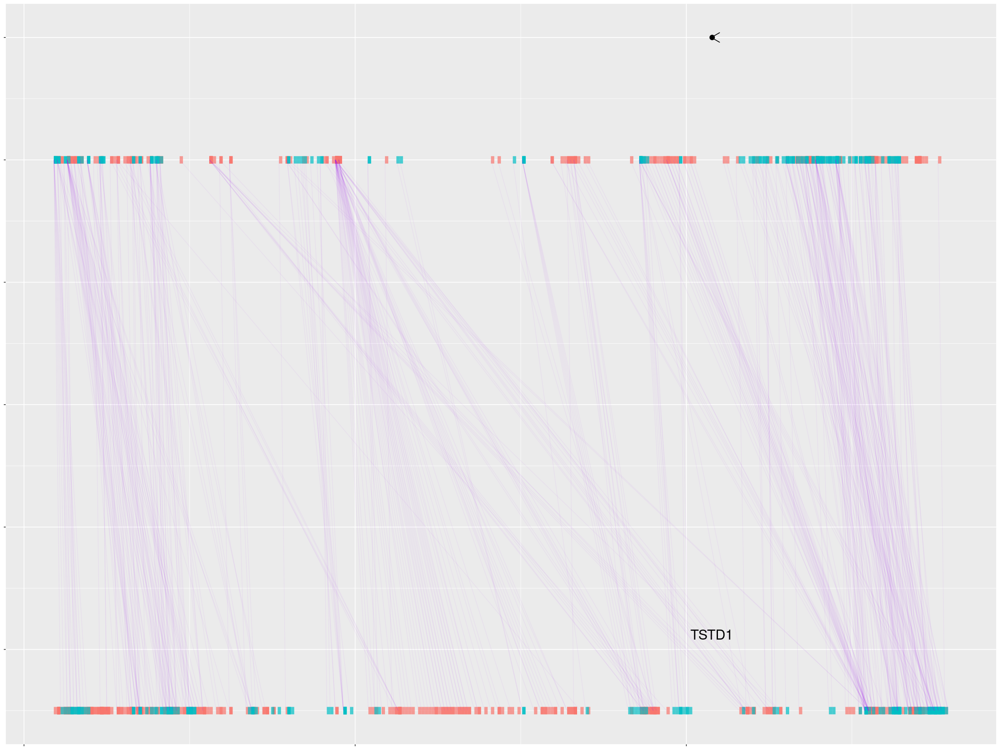


 Inh TSTD1  Oli TSTD1 eQTL TSTD1 pQTL TSTD1     H3K9ac       DNAm 
      3584       3584       3584       3584       3584       3584 

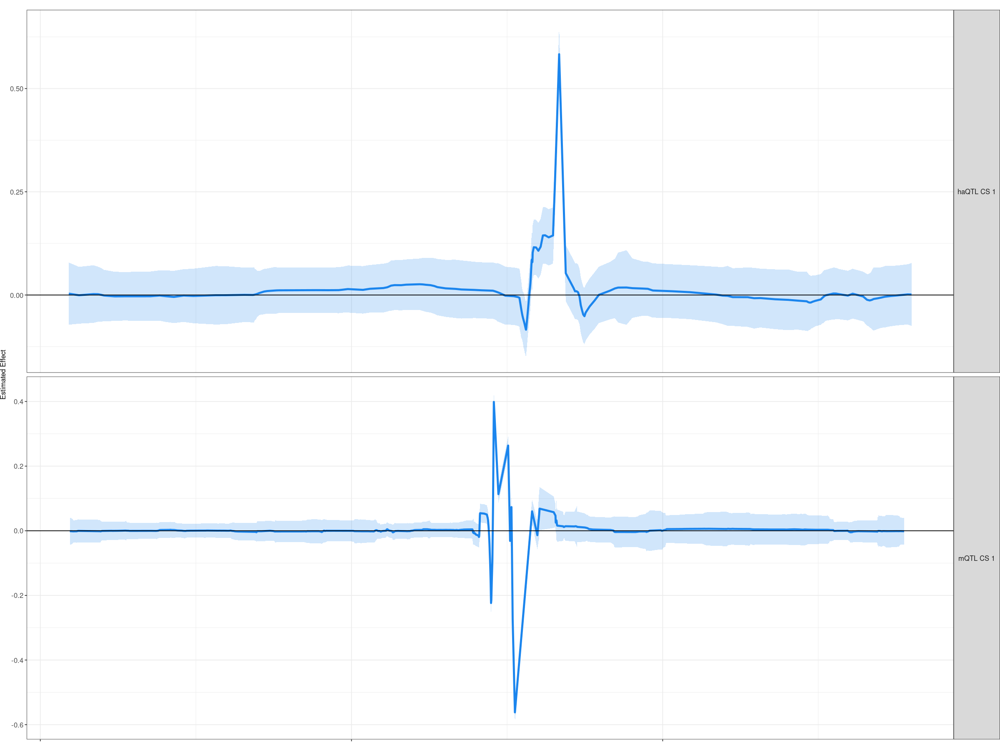

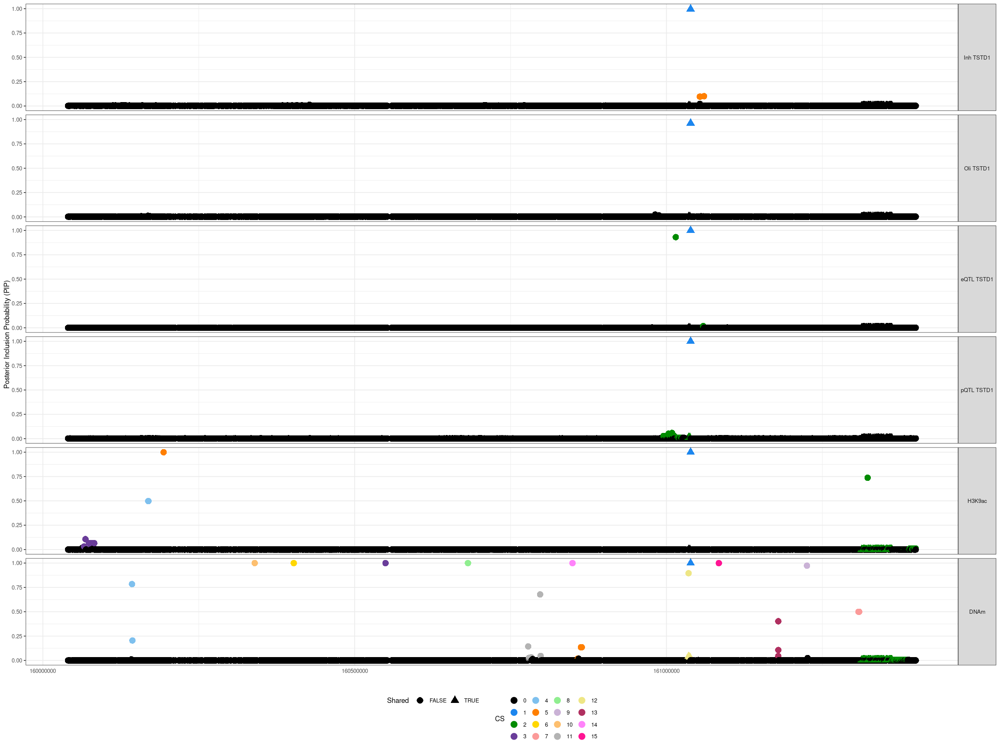

Warning message:
“Removed 1 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 82 rows containing missing values (`geom_segment()`).”


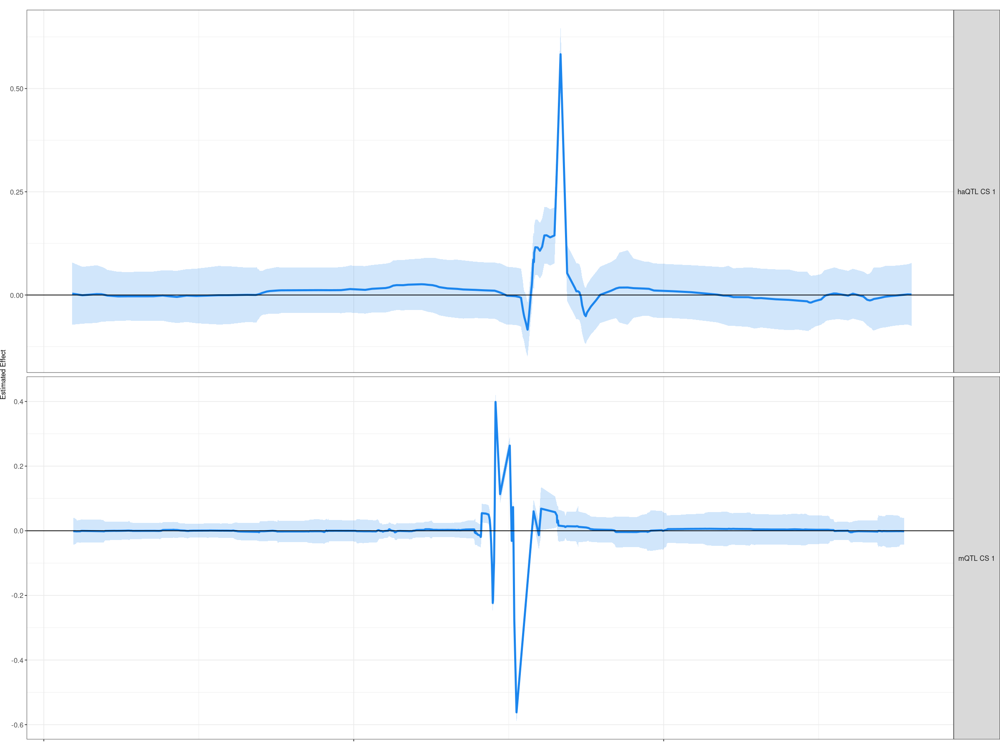

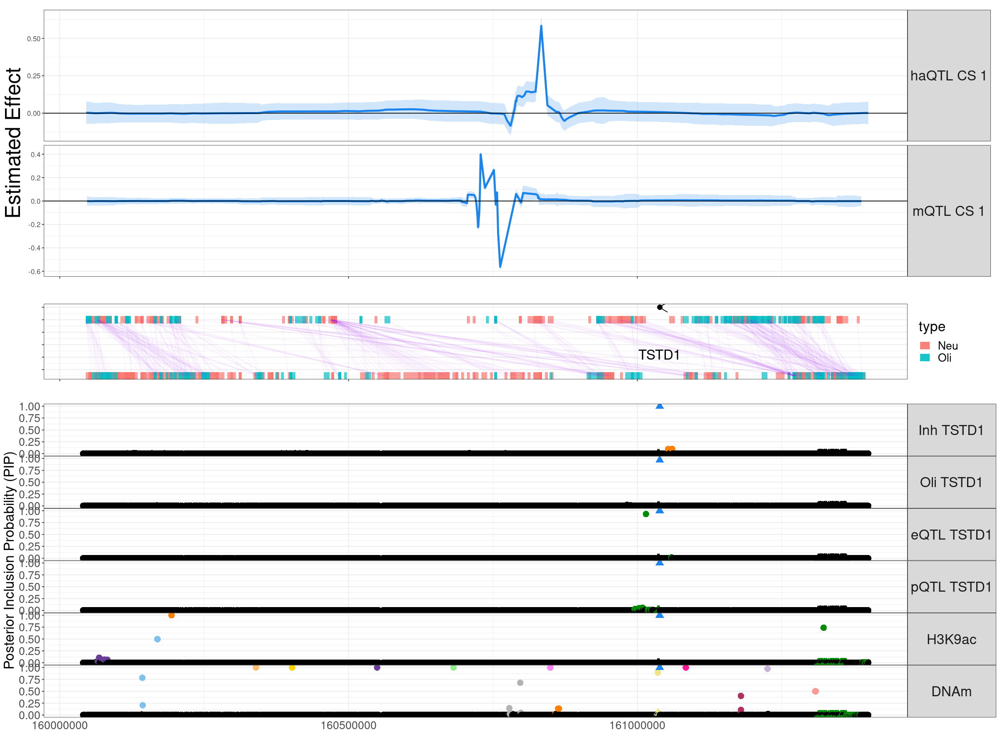

In [675]:
gene_plot75  = read_delim("superfine_casestudy/4_tad75gene_info.tsv")%>%mutate(strand = strand%>%as.factor%>%as.numeric)
gene_plot75 = gene_plot75%>%filter(gene_name == "TSTD1")
chr = "chr1"
#gene_plot[4,] = gene_plot[3,]
#gene_plot[4,] = list("chr15",34075155,33858782, "ENSG00000169857" , "AVEN" ,2,2 )
gene_plot75$x_label <- (0.5*(gene_plot75$end-gene_plot75$start)+gene_plot75$start)
#gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")] <- gene_plot$x_label[which(gene_plot$gene_name=="CHRM5")]+20000
nn = 0.9
gene_plot_plot <-ggplot(gene_plot75,aes()) +
  geom_segment( aes(x = start,xend = end, y = (nn-strand/100), yend =(nn-strand/100) ) ,
                arrow = arrow(length = unit(0.5, "cm")) )+
  geom_text(aes(x = x_label,y = (nn-0.05-strand/100), label = gene_name, vjust=-1),
            size = 7)+
  ylab("")+
  xlab("")+
  theme(legend.position="none")+
  theme(text = element_blank())+
  xlim(plot_range)+
  geom_point(aes(x = start, y = (nn-strand/100)),
             color = "black",size = 3  )+        
    geom_segment( aes(color = type,x = start,xend = end, y = 0.88, yend =  0.88),alpha = 0.7,size = 5, data = annotation%>%select(type,start = start1, end = end1, chr = chr1)%>%filter(chr == chr, start > plot_range[[1]],end < plot_range[[2]]  )  ) +
    geom_segment( aes(color = type,x = start,xend = end, y = 0.835, yend =  0.835),alpha = 0.7,size = 5, data = annotation%>%select(type,start = start2,start1, end = end2, chr = chr1)%>%filter(chr == chr, start > plot_range[[1]],end < plot_range[[2]]  )  ) +
    geom_segment( aes(x = start1,xend = start2, y = 0.88 , yend = 0.835 ),alpha = 0.05,size = 0.5, color  = "purple",  annotation%>%select(type, start2,start1,  chr = chr1)%>%filter(chr == chr, start1 > plot_range[[1]],start1 < plot_range[[2]]  )  ) 

gene_plot_plot


library("dplyr")
library("readr")
library("stringr")
library("purrr")
library("tidyr")
library("ggplot2")
library("cowplot")
library("ComplexUpset")
n = c(1,2,3,4)
color = color2 = c("black", "dodgerblue2", "#6A3D9A","#FF7F00","skyblue2","#6A3D9A",
                   "gold1",  "#FB9A99", "palegreen2",
                   "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
                   "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
                   "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
                   "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
                   "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")




#refine_effect_plot =  read_delim(paste(path,"4_1182_effect.tsv", sep=""))
refine_effect_plot<-  ggplot( effect75  )+
  geom_line(aes(x = pos, y = mid,color = effect), size=1.4)+
  geom_ribbon(aes(x = pos,
                  y = mid,
                  ymin = low,
                  ymax = up,
                  fill = effect),
              alpha = 0.2)+
  ylab("Estimated Effect") +
  xlab("POS")+
  facet_grid(factor(type,levels =  c("haQTL_Effect_1",
                                     "mQTL_Effect_1"
                                     ),
                    labels =   c("haQTL CS 1",
                                 "mQTL CS 1")
  )~., scales = "free" )+
  scale_color_manual("Credible set",values = color2[n+1])+
  geom_hline(aes(yintercept = 0), color = "black")+
  scale_fill_manual("Credible set",values = color2[n+1])+
  theme_bw()+
  xlab("") +
  ylab("Estimated Effect")+
  theme(text = element_text(size = 10),
        legend.position="none")+
  theme(plot.margin=unit(c(5,0,0,0),"mm"),
        strip.text.y.right = element_text(angle = 0,
                                          size = 10),
        axis.text.x = element_blank(),
        axis.text.y = element_text(size = 10)
  )


refine_effect_plot


refine_plot =tmp4%>%filter(str_detect(snp,"chr1:") )
plot_range = c(min(refine_plot$pos),max(refine_plot$pos))
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="haQTL tad75" )]<- "H3K9ac"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="mQTL tad75" )]<- "DNAm"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="pQTL 1_TSTD1_Q8NFU3" )]<- "pQTL TSTD1"
refine_plot$molecular_trait_id <- factor(refine_plot$molecular_trait_id , levels = c("Inh TSTD1", "Oli TSTD1","eQTL TSTD1","pQTL TSTD1",
                                                                                      "H3K9ac",
                                                                                      "DNAm" ))
color = color2 = c("black", "dodgerblue2","green4","#6A3D9A","skyblue2", "#FF7F00",
                   "gold1",  "#FB9A99", "palegreen2",
                   "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
                   "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
                   "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
                   "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
                   "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")
##### Change coloring of non-overlap CS
#refine_plot%>%mutate(new_CS = case_when(molecular_trait_id == "Oli TMEM131L" & new_CS == 2 ~  9,
#                                    molecular_trait_id == "H3K9ac" & new_CS == 2 ~  10,
#                                     molecular_trait_id == "DNAm" & !Shared & new_CS == 1 ~  11,
#                                    .default = new_CS 
#                                   ))-> refine_plot

#### Add sign annotation, see pseudobulk notebook for code to gather this info
#sign = 
# refine_plot%>%group_by(molecular_trait_id, new_CS)%>%
#    summarize(pos = max(pos[which(y == max(y))]), y = max(y))%>%filter(new_CS != 0)%>%
#    filter(!molecular_trait_id%in% c("H3K9ac", "DNAm")) %>%ungroup%>%mutate(sign = c("-","-","-","+","-") )
#refine_plot = left_join(refine_plot,sign)
#


table(refine_plot$molecular_trait_id )
refine_plot  <-  ggplot2::ggplot(refine_plot,aes(y = y,
                                                 x = pos,
                                                 col =  as.factor(new_CS),
                                                 shape = Shared )) +
    #geom_text(alpha = 0.5, aes(x =pos + 1000, y = y + 0.25,color =  as.factor(new_CS), label = sign ) , size = 10)+
  facet_grid(molecular_trait_id ~.)+
  geom_point(size = 4) +
  scale_color_manual("CS",values = color) +
  theme_bw()+
  theme(axis.ticks.x = element_blank()) +
  ylab("Posterior Inclusion Probability (PIP)")+
  xlim(plot_range)+
  theme(axis.ticks.x = element_blank() ) +
  theme(strip.text.y.right = element_text(angle = 0))+
  xlab("") +
  theme(text = element_text(size = 10),legend.position = "bottom")
refine_plot


refine_effect_plot+
  xlim(plot_range)










cowplot::plot_grid(plotlist = list(refine_effect_plot+theme(strip.text.y.right = element_text(angle = 0,size = 20))+
                                     xlim(plot_range)+
                                     theme(text = element_text(size = 30)),#microglia_enhancer_activity,#+facet_grid(TargetGene_name~., scales = "free"),
                                   gene_plot_plot+
                                     theme_bw()+
                                     theme(axis.text.x = element_blank(),
                                           axis.text.y = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0))+
                                     xlab("")+
                                     theme(text = element_text(size = 20)),
                                   refine_plot+
                                     theme_bw()+
                                     theme(axis.ticks.x = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0,size = 20))+
                                     xlab("") +ylim(c(0,1))+
                                     theme(text = element_text(size = 20),
                                           panel.spacing=unit(0, "lines"),legend.position = "none")
                                   
) ,
ncol = 1,
align = "v",
axis = "tlbr",
rel_heights = c(6,2,7)
)

In [ ]:
left_join(refine_plot,sign)%>%filter(!is.na(sign))

In [642]:
tmp4%>%filter(str_detect(snp,"chr1:") )%>%count(molecular_trait_id)

molecular_trait_id,n
<chr>,<int>
Inh TSTD1,3584
Oli TSTD1,3584
eQTL TSTD1,3584
haQTL tad75,3584
mQTL tad75,3584
pQTL 1_TSTD1_Q8NFU3,3584


In [ ]:
refine_plot =read_delim("4_435_pip_oli.tsv")
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="Oli_eQTL_TMEM131L" )]<- "Oli TMEM131L"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="Oli_eQTL_MND1" )]<- "Oli MND1"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="Oli_eQTL_TRIM2" )]<- "Oli TRIM2"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="eQTL_TMEM131L" )]<- "TMEM131L"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="haQTL_tad435" )]<- "H3K9ac"
refine_plot$molecular_trait_id  [ which(refine_plot$molecular_trait_id =="mQTL_tad435" )]<- "DNAm"
refine_plot$molecular_trait_id <- factor(refine_plot$molecular_trait_id , levels = c("Oli MND1","Oli TRIM2", "Oli TMEM131L","TMEM131L",
                                                                                      "H3K9ac",
                                                                                      "DNAm" ))
color = color2 = c("black", "dodgerblue2","green4","#6A3D9A","skyblue2", "#FF7F00",
                   "gold1",  "#FB9A99", "palegreen2",
                   "#CAB2D6", "#FDBF6F", "gray70", "khaki2", "maroon", "orchid1",
                   "deeppink1", "blue1", "steelblue4", "darkturquoise", "green1",
                   "yellow4", "yellow3","darkorange4","brown","navyblue","#FF0000",
                   "darkgreen","#FFFF00","purple","#00FF00","pink","#0000FF",
                   "orange","#FF00FF","cyan","#00FFFF","#FFFFFF")%>%unique()
#### Change coloring of non-overlap CS
refine_plot%>%mutate(new_CS = case_when(molecular_trait_id == "Oli TMEM131L" & new_CS == 2 ~  9,
                                    molecular_trait_id == "H3K9ac" & new_CS == 2 ~  10,
                                     molecular_trait_id == "DNAm" & !Shared & new_CS == 1 ~  11,
                                    .default = new_CS 
                                   ))-> refine_plot
refine_plot%>%mutate(new_CS = case_when(
                                     molecular_trait_id == "DNAm" & !Shared & CS == 3 ~  12,
                                    .default = new_CS 
                                   ))-> refine_plot



### Add sign annotation, see pseudobulk notebook for code to gather this info
sign = 
 refine_plot%>%group_by(molecular_trait_id, new_CS)%>%
    summarize(pos = max(pos[which(y == max(y))]), y = max(y))%>%filter(new_CS != 0)%>%
    filter(!molecular_trait_id%in% c("H3K9ac", "DNAm")) %>%ungroup%>%mutate(sign = c("-","-","-","+","-") )
refine_plot = left_join(refine_plot,sign)



table(refine_plot$molecular_trait_id )
refine_plot  <-  ggplot2::ggplot(refine_plot,aes(y = y,
                                                 x = pos,
                                                 col =  as.factor(new_CS),
                                                 shape = Shared )) +
    geom_text( aes(x =pos + 6000, y = y ,color =  as.factor(new_CS), label = sign ),alpha = 0.5 , size = 10)+
  facet_grid(molecular_trait_id ~.)+
  geom_point(size = 4) +
  scale_color_manual("CS",values = color) +
  theme_bw()+
  theme(axis.ticks.x = element_blank()) +
  ylab("Posterior Inclusion Probability (PIP)")+
  xlim(plot_range)+
  theme(axis.ticks.x = element_blank() ) +
  theme(strip.text.y.right = element_text(angle = 0))+
  xlab("") +
  theme(text = element_text(size = 10),legend.position = "bottom")
refine_plot


refine_effect_plot+
  xlim(plot_range)


cowplot::plot_grid(plotlist = list(refine_effect_plot+
                                     xlim(plot_range),
                                   gene_plot_plot+
                                     theme_bw()+
                                     theme(axis.text.x = element_blank(),
                                           axis.text.y = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0))+
                                     xlab("") +
                                     theme(text = element_text(size = 2)),
                                   refine_plot+
                                     theme_bw()+
                                     theme(axis.ticks.x = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0,size = 10))+
                                     xlab("") +
                                     theme(text = element_text(size = 10),
                                           panel.spacing=unit(2, "lines"),legend.position = "none")
) ,
ncol = 1,
align = "v",
axis = "tlbr",
rel_heights = c(6,1,6)
)

In [46]:
cowplot::plot_grid(plotlist = list(refine_effect_plot+theme(strip.text.y.right = element_text(angle = 0,size = 20))+
                                     xlim(plot_range)+
                                     theme(text = element_text(size = 30)),#microglia_enhancer_activity,#+facet_grid(TargetGene_name~., scales = "free"),
                                   gene_plot_plot+
                                     theme_bw()+
                                     theme(axis.text.x = element_blank(),
                                           axis.text.y = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0))+
                                     xlab("") +geom_point( aes(x = X4,xend = X5, y = 0.815 , yend = 0.815 ),size = 2, color  = "darkgreen", data = annotated%>%count(X3,X4,X5)%>%filter(X3 %in% c("transcript")))+
                                     xlab("") +geom_point( aes(x = X4,xend = X5, y = 0.815 , yend = 0.815 ),size = 2, color  = "red", data = annotated%>%count(X3,X4,X5)%>%filter(X3 %in% c("transcript"), X4 ==153601955))+
                                   #geom_segment( aes(x = X4,xend = X5, y = 0.815 , yend = 0.815 ),size = 7, color  = "red", data = annotated%>%count(X3,X4,X5)%>%filter(X3 %in% c("exom")))+

                                   ##geom_point( aes(x = start,xend = end, y = 0.815 , yend = 0.815),alpha = 0.5,size = 2, color  = "green", data = ha%>%filter(`#chr` == "chr4")) +
                                     #geom_segment( aes(x = start,xend = end, y = 0.5, yend = 0.5 ),size = 10, color  = "yellow", data = annot_ATAT_seq%>%filter(chr == "chr15", start > plot_range[[1]],end < plot_range[[2]]  )  ) +
                                     #geom_segment( aes(x = start,xend = end, y = 0.825, yend = 0.825 ),size = 3,color  = "cyan", data = read_delim("./added_annotation/Oli_hg38.pro.Nott.tsv")%>%filter(chr == "chr15", start > plot_range[[1]],end < plot_range[[2]]  )  ) +
                                   geom_segment( aes(x = start,xend = end, y = 0.88, yend =  0.88),alpha = 0.7,size = 5, color  = "cyan", data = read_delim("./added_annotation/Oli_hg38.Int.Nott.tsv")%>%select(start = start1, end = end1, chr = chr1)%>%filter(chr == "chr4", start > plot_range[[1]],end < plot_range[[2]]  )  ) +
                                   geom_segment( aes(x = start,xend = end, y = 0.835, yend = 0.835 ),alpha = 0.7,size = 5, color  = "cyan", data = read_delim("./added_annotation/Oli_hg38.Int.Nott.tsv")%>%select(start = start2, end = end2, chr = chr2,start1)%>%filter(chr == "chr4", start1 > plot_range[[1]],end < plot_range[[2]]  )  ) +
                                   geom_segment( aes(x = start,xend = end, y = 0.88, yend = 0.88 ),alpha = 0.7,size = 5, color  = "blue", data = read_delim("./added_annotation/Oli_hg38.Int.Nott.tsv")%>%select(start = start1, end = end1, chr = chr1)%>%filter(chr == "chr4", start %in% c(153333848,153343848)  )  ) +
                                   #geom_point( aes(x = 153463513, y = 0.85 ),size = 10, color  = "black")+
                                   #geom_segment(aes = (x =  153463513,xend = 153463513,y = 0.85,yend = 0.85), color = "red" , size = 5) + 
                                   geom_segment( aes(x = start,xend = end, y = 0.835, yend =  0.835),alpha = 0.7,size = 5, color  = "blue", data = read_delim("./added_annotation/Oli_hg38.Int.Nott.tsv")%>%select(start = start2, end = end2, chr = chr2,start1)%>%filter(chr == "chr4", start1  %in% c(153333848,153343848) )  ) +
                                   #geom_segment( aes(x = start,xend = end, y = 0.835, yend = 0.835 ),alpha = 0.7,size = 5, color  = "cyan", data = read_delim("./added_annotation/Ast_hg38.Enh.Nott.tsv")%>%filter(chr == "chr4", start > plot_range[[1]],end < plot_range[[2]]  )  ) +
                                   #geom_segment( aes(x = start,xend = end, y = 0.835, yend = 0.835 ),alpha = 0.7,size = 5, color  = "blue", data = read_delim("./added_annotation/microglia_hg38.Enh.Nott.tsv")%>%filter(chr == "chr4", start > plot_range[[1]],end < plot_range[[2]]  )  ) +
                                   #geom_segment( aes(x = start,xend = end, y = 0.835, yend = 0.835 ),alpha = 0.7,size = 5, color  = "red", data = read_delim("./added_annotation/Neu_hg38.Enh.Nott.tsv")%>%filter(chr == "chr4", start > plot_range[[1]],end < plot_range[[2]]  )  ) +
                                   geom_segment( aes(x = start1,xend = start2, y = 0.88 , yend = 0.835 ),alpha = 0.2,size = 0.5, color  = "purple", data = read_delim("./added_annotation/Oli_hg38.Int.Nott.tsv")%>%filter(chr1 == "chr4", start2 > plot_range[[1]],end2 < plot_range[[2]]  )  ) +
                                   xlab("") +geom_segment( aes(x = X4,xend = X5, y = 0.815 , yend = 0.815 ),size = 4,alpha = 0.3, color  = "green", data = read_delim("4_435_gene_exom.tsv","\t"))+  
                                   #geom_point( aes(x = BP, y = 0.6 ),size = 1, color  = "black", data = enh)+
                                     theme(text = element_text(size = 20)),
                                   refine_plot+
                                     theme_bw()+
                                     theme(axis.ticks.x = element_blank()) +
                                     theme(strip.text.y.right = element_text(angle = 0,size = 20))+
                                     xlab("") +ylim(c(0,1))+
                                     theme(text = element_text(size = 20),
                                           panel.spacing=unit(0, "lines"),legend.position = "none")
                                   
) ,
ncol = 1,
align = "v",
axis = "tlbr",
rel_heights = c(6,2,7)
)

ERROR: Error in count(., X3, X4, X5): object 'annotated' not found


## Add pip to plot table

In [ ]:
pipplot_df_1411 = read_delim("superfine_casestudy//4_tad1411pip_superfine.tsv")
pipplot_df_75 = read_delim("superfine_casestudy//4_tad75pip_superfine.tsv")
pipplot_df_185 = read_delim("superfine_casestudy//4_tad185pip_superfine.tsv")

Rows: 12396 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): snp, molecular_trait_id
dbl (4): y, pos, CS, new_CS
lgl (1): Shared

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 14336 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): snp, molecular_trait_id
dbl (4): y, pos, CS, new_CS
lgl (1): Shared

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 16784 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): snp, molecular_trait_id
dbl (4): y, pos, CS, new_CS
lgl (1): Shared

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types

In [370]:
pipplot_df_185

y,snp,pos,CS,molecular_trait_id,Shared,new_CS
<dbl>,<chr>,<dbl>,<dbl>,<chr>,<lgl>,<dbl>
0.001292882,chr2:111840155_A_G,111840155,0,pQTL_2_FBLN7_Q53RD9,FALSE,0
0.001106518,chr2:111840190_TAAAG_T,111840190,0,pQTL_2_FBLN7_Q53RD9,FALSE,0
0.001429060,chr2:111840263_C_T,111840263,0,pQTL_2_FBLN7_Q53RD9,FALSE,0
0.001679746,chr2:111840400_A_G,111840400,0,pQTL_2_FBLN7_Q53RD9,FALSE,0
0.001164793,chr2:111840542_C_T,111840542,0,pQTL_2_FBLN7_Q53RD9,FALSE,0
0.001264259,chr2:111840957_C_G,111840957,0,pQTL_2_FBLN7_Q53RD9,FALSE,0
0.001678973,chr2:111841000_G_A,111841000,0,pQTL_2_FBLN7_Q53RD9,FALSE,0
0.001679746,chr2:111841619_G_A,111841619,0,pQTL_2_FBLN7_Q53RD9,FALSE,0
0.001679746,chr2:111841637_G_A,111841637,0,pQTL_2_FBLN7_Q53RD9,FALSE,0


##  additional cs analysis 

In [76]:
within = function(x,y,z){ a = (x <= z & x>=y)
                        return(a)}

In [74]:
eqtl_bed = read_delim("/mnt/vast/hpc/csg/molecular_phenotype_calling/eqtl/dlpfc_region_list")

Rows: 26833 Columns: 4
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): #chr, gene_id
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [77]:
eqtl_bed%>%filter(start%>%within(3.63e+7,3.65e+7), `#chr` == "chr22"  )

#chr,start,end,gene_id
<chr>,<dbl>,<dbl>,<chr>
chr22,36387966,36387967,ENSG00000100345
chr22,36388625,36388626,ENSG00000223695
chr22,36481639,36481640,ENSG00000100348


In [ ]:
a = readRDS("/mnt/vast/hpc/csg/molecular_phenotype_calling/eqtl/output/susie_per_gene_tad/cache/demo.ENSG00000237406.unisusie.fit.rds")

In [15]:
e16%>%filter(molecular_trait_id =="ENSG00000128335")

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end,cs_size
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
chr22:36239710_G_A,2350,22,36239710,G,A,c(L1 = 1),NA,309.968276420506;-0.574374425093705;-0.606561408052919;-0.615820785061936;-0.60847560045862;-0.595093156071101;-0.581081106346435;-0.568546019462219;-0.558133797371841;-0.549782974100359,1,-0.01407296,0.0258274,-0.5448847,ENSG00000128335,35320000,36480000,1


In [17]:
e16%>%filter(molecular_trait_id =="ENSG00000128284")

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end,cs_size
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
chr22:36141845_A_G,1895,22,36141845,A,G,c(L1 = 1),NA,14.8870374603361;-0.610954324092724;-0.00912799206593196;-0.00850196746760323;-0.00861048420060451;-0.00928016135452836;-0.010224973538659;-0.0111214513853271;-0.0116797903261285;-0.0117008334436954,0.55279178,1.022146e-05,0.09777680,0.0001045387,ENSG00000128284,35320000,36480000,14
chr22:36145777_C_T,1913,22,36145777,C,T,c(L1 = 1),NA,11.8738344478637;-0.618255481403149;-0.0998432255859805;-0.0979933703143083;-0.0983346914271661;-0.100337634624538;-0.103090137446135;-0.105636359233778;-0.107198282092187;-0.107272810542821,0.02939346,-4.258137e-05,0.02850222,-0.0014939665,ENSG00000128284,35320000,36480000,14
chr22:36146083_C_A,1916,22,36146083,C,A,c(L1 = 1),NA,11.8424223315965;-0.598501801394879;-0.0988770818217173;-0.0970411316832323;-0.0973791588176707;-0.0993657092435503;-0.102095975102286;-0.104621634804153;-0.106170667550262;-0.106243801569175,0.02856022,6.438443e-06,0.02803915,0.0002296233,ENSG00000128284,35320000,36480000,14
chr22:36146166_G_A,1918,22,36146166,G,A,c(L1 = 1),NA,11.8738344478637;-0.618255481403149;-0.0998432255859805;-0.0979933703143083;-0.0983346914271661;-0.100337634624538;-0.103090137446135;-0.105636359233778;-0.107198282092187;-0.107272810542821,0.02939346,-1.943656e-03,0.02850222,-0.0681931457,ENSG00000128284,35320000,36480000,14
chr22:36146253_T_C,1919,22,36146253,T,C,c(L1 = 1),NA,11.9122661378113;-0.589948085208696;-0.0952937063129813;-0.0935089454509823;-0.09383741913057;-0.0957685567755453;-0.0984235192191845;-0.10088032008313;-0.102387431290721;-0.102458440426286,0.03046440,-4.685952e-03,0.02907900,-0.1611455510,ENSG00000128284,35320000,36480000,14
chr22:36146273_G_A,1920,22,36146273,G,A,c(L1 = 1),NA,11.9122661378113;-0.589948085208696;-0.0952937063129813;-0.0935089454509823;-0.09383741913057;-0.0957685567755453;-0.0984235192191845;-0.10088032008313;-0.102387431290721;-0.102458440426286,0.03046440,-4.876290e-03,0.02907900,-0.1676911042,ENSG00000128284,35320000,36480000,14
chr22:36146319_C_T,1921,22,36146319,C,T,c(L1 = 1),NA,11.9122661378113;-0.589948085208696;-0.0952937063129813;-0.0935089454509823;-0.09383741913057;-0.0957685567755453;-0.0984235192191845;-0.10088032008313;-0.102387431290721;-0.102458440426286,0.03046440,-4.876290e-03,0.02907900,-0.1676911042,ENSG00000128284,35320000,36480000,14
chr22:36146361_T_C,1922,22,36146361,T,C,c(L1 = 1),NA,11.8738344478637;-0.618255481403149;-0.0998432255859805;-0.0979933703143083;-0.0983346914271661;-0.100337634624538;-0.103090137446135;-0.105636359233778;-0.107198282092187;-0.107272810542821,0.02939346,-4.876290e-03,0.02850222,-0.1710845523,ENSG00000128284,35320000,36480000,14
chr22:36146610_A_C,1924,22,36146610,A,C,c(L1 = 1),NA,12.6738863353527;-0.314881931719907;-0.0377108703845441;-0.0367293176502033;-0.0369009577950858;-0.0379491068207678;-0.0394053615919268;-0.0407648468847914;-0.0416009134263204;-0.0416308607912499,0.06269026,-1.002261e-05,0.04297090,-0.0002332419,ENSG00000128284,35320000,36480000,14


In [18]:
pseudo%>%filter(molecular_trait_id =="ENSG00000128284")

variants,snps_index,chromosome,position,ref,alt,cs_order,cs_id,log10_base_factor,pip,posterior_mean,posterior_sd,z,molecular_trait_id,finemapped_region_start,finemapped_region_end,type
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
chr22:36182034_C_A,2029,22,36182034,C,A,c(L1 = 1),NA,77.3281012921076;-0.752036741799386;0;0;0;0;0;0;0;0,0.09119069,-0.047844201,0.15165206,-0.3154866,ENSG00000128284,35166176,36166176,Ast
chr22:36182806_G_A,2031,22,36182806,G,A,c(L1 = 1),NA,77.8781947957765;-0.74264441648254;0;0;0;0;0;0;0;0,0.15798266,-0.083216950,0.19289480,-0.4314111,ENSG00000128284,35166176,36166176,Ast
chr22:36184831_G_A,2035,22,36184831,G,A,c(L1 = 1),NA,76.8877572910558;-0.900562037169694;0;0;0;0;0;0;0;0,0.05873758,-0.030717081,0.12348106,-0.2487594,ENSG00000128284,35166176,36166176,Ast
chr22:36184840_T_TG,2036,22,36184840,T,TG,c(L1 = 1),NA,76.8877572910558;-0.900562037169694;0;0;0;0;0;0;0;0,0.05873758,-0.030717081,0.12348106,-0.2487594,ENSG00000128284,35166176,36166176,Ast
chr22:36185042_T_C,2038,22,36185042,T,C,c(L1 = 1),NA,75.8814027539435;-0.915822464079104;0;0;0;0;0;0;0;0,0.02153674,-0.011157726,0.07562885,-0.1475327,ENSG00000128284,35166176,36166176,Ast
chr22:36185122_A_G,2039,22,36185122,A,G,c(L1 = 1),NA,76.8877572910558;-0.900562037169694;0;0;0;0;0;0;0;0,0.05873758,-0.030717081,0.12348106,-0.2487594,ENSG00000128284,35166176,36166176,Ast
chr22:36185703_G_A,2042,22,36185703,G,A,c(L1 = 1),NA,76.7694028643174;-0.902262837175881;0;0;0;0;0;0;0;0,0.05219294,-0.027268240,0.11670063,-0.2336597,ENSG00000128284,35166176,36166176,Ast
chr22:36186340_T_C,2043,22,36186340,T,C,c(L1 = 1),NA,76.7694028643174;-0.902262837175881;0;0;0;0;0;0;0;0,0.05219294,-0.027268240,0.11670063,-0.2336597,ENSG00000128284,35166176,36166176,Ast
chr22:36186528_A_G,2044,22,36186528,A,G,c(L1 = 1),NA,76.8877572910558;-0.900562037169694;0;0;0;0;0;0;0;0,0.05873758,-0.030717081,0.12348106,-0.2487594,ENSG00000128284,35166176,36166176,Ast


In [20]:
remap = read_delim("../added_annotation/remap2022_crm_macs2_hg38_v1_0.bed.gz","\t")

Rows: 3329427 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): chr1, TEAD4,ESRRA,ZNF157,TARDBP,ZBTB26,FEZF1,TSHZ1,E4F1,MNT,ZNF639,...
dbl (5): 9829, 10459, 148, 10101, 10102
num (1): 204,120,188

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [ ]:
remap$